In [1]:
import pandas as pd
from pathlib import Path
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import re
from sklearn.linear_model import LinearRegression

In [2]:
grandparent_dir = Path('/home/user0/data')

temps = range(300, 350+1, 50) # T = 300, T = 325, T = 350, T = 375 
nts   = range(20,  30+1,  10) # start: 20, stop: 31 (exclusive), step: 10
cohs  = range(15,  25+1,   5)
nafls = range( 3,  11+1,   4)

D = ("2.7nm", "4.0nm")
############################################################################
# wats03_nt20 = [200,] + list(range(300, 400+1, 100))   
# wats07_nt20 = [222,] + list(range(300, 700+1, 100))          # = (222, 300, 400, 500, 600, 700)
# wats11_nt20 = [222,] + list(range(400, 800+1, 100))
wats03_nt20 = [222,] + list(range(300, 400+1, 100))   
wats07_nt20 = list(range(300, 700+1, 100))          # = (222, 300, 400, 500, 600, 700)
wats11_nt20 = list(range(400, 800+1, 100))

# wats03_nt30 = [500,] + list(range(600,   700+1, 100))
# wats07_nt30 = [500,] + list(range(800,  1200+1, 100))
# wats11_nt30 = [500,] + list(range(1300, 1700+1, 100))
wats03_nt30 = [500,] + list(range(600,   700+1, 100))
wats07_nt30 = list(range(800,  1200+1, 100))
wats11_nt30 = list(range(1300, 1700+1, 100))

# parent_dirs = list[f"COHCH_gra_t{i}" for i in temps)         # = ('COHCH_gra_t300', 'COHCH_gra_t325', 'COHCH_gra_t350', 'COHCH_gra_t375')
############################################################################

for temp in temps:
    parent_dir = str(f"COHCH_gra_t{temp}")
    print(f"T={temp}")
    
    for nt in nts:
        print(f"T={temp} & nt={nt}")
        print("")

        for nafl in nafls:
            match (nafl, nt):
                case (3,  20):
                    wats = wats03_nt20 
                case (7,  20):
                    wats = wats07_nt20 
                case (11, 20):
                    wats = wats11_nt20 
                case (3,  30):
                    wats = wats03_nt30 
                case (7,  30):
                    wats = wats07_nt30 
                case (11, 30):
                    wats = wats11_nt30 

            for coh in cohs:
                for wat in wats:
                    child_dir  = f"nt{nt}-coh{coh}-nafl{nafl}-t{temp}-wat{wat}"
                    child_dir_path = Path(grandparent_dir/parent_dir/child_dir/"output_analysis")
                    
                    count_Ow_above_tube_path = Path(child_dir_path/"above_tube"/"count_Ow.dat")
                    count_Oh_above_tube_path = Path(child_dir_path/"above_tube"/"count_Oh.dat")
                    count_Ow_in_tube_path    = Path(child_dir_path/"in_tube"/"count_Ow.dat")
                    count_Oh_in_tube_path    = Path(child_dir_path/"in_tube"/"count_Oh.dat") 
                    
                    print(f"file {count_Ow_above_tube_path} exits? {count_Ow_above_tube_path.exists()}")
                    print(f"file {count_Oh_above_tube_path} exits? {count_Oh_above_tube_path.exists()}")
                    print(f"file {count_Ow_in_tube_path}    exits? {count_Ow_in_tube_path.exists()}")
                    print(f"file {count_Oh_in_tube_path}    exits? {count_Oh_in_tube_path.exists()}")
                    print("")

                    if count_Ow_above_tube_path.exists() == False:
                        continue
                    if count_Oh_above_tube_path.exists() == False:
                        continue
                    if count_Ow_in_tube_path.exists()    == False:
                        continue
                    if count_Oh_in_tube_path.exists()    == False:
                        continue
        
        print("===============================================================================================")
    print("")
    print("===============================================================================================")
    print("===============================================================================================")                


T=300
T=300 & nt=20

file /home/user0/data/COHCH_gra_t300/nt20-coh15-nafl3-t300-wat222/output_analysis/above_tube/count_Ow.dat exits? True
file /home/user0/data/COHCH_gra_t300/nt20-coh15-nafl3-t300-wat222/output_analysis/above_tube/count_Oh.dat exits? True
file /home/user0/data/COHCH_gra_t300/nt20-coh15-nafl3-t300-wat222/output_analysis/in_tube/count_Ow.dat    exits? True
file /home/user0/data/COHCH_gra_t300/nt20-coh15-nafl3-t300-wat222/output_analysis/in_tube/count_Oh.dat    exits? True

file /home/user0/data/COHCH_gra_t300/nt20-coh15-nafl3-t300-wat300/output_analysis/above_tube/count_Ow.dat exits? True
file /home/user0/data/COHCH_gra_t300/nt20-coh15-nafl3-t300-wat300/output_analysis/above_tube/count_Oh.dat exits? True
file /home/user0/data/COHCH_gra_t300/nt20-coh15-nafl3-t300-wat300/output_analysis/in_tube/count_Ow.dat    exits? True
file /home/user0/data/COHCH_gra_t300/nt20-coh15-nafl3-t300-wat300/output_analysis/in_tube/count_Oh.dat    exits? True

file /home/user0/data/COHCH_gra_t

In [3]:

DataFrame_dict_Ow_above_tube = {}
DataFrame_dict_Oh_above_tube = {}
DataFrame_dict_Ow_in_tube = {}
DataFrame_dict_Oh_in_tube = {} 

dicts_list = [ DataFrame_dict_Ow_above_tube, 
               DataFrame_dict_Oh_above_tube, 
               DataFrame_dict_Ow_in_tube, 
               DataFrame_dict_Oh_in_tube,]

######################################
for temp in temps:
    parent_dir = str(f"COHCH_gra_t{temp}")

    for nt in nts:
        for nafl in nafls:
            match (nafl, nt):
                case (3, 20):
                    wats = wats03_nt20 
                case (7, 20):
                    wats = wats07_nt20 
                case (11, 20):
                    wats = wats11_nt20 
                case (3, 30):
                    wats = wats03_nt30 
                case (7, 30):
                    wats = wats07_nt30 
                case (11, 30):
                    wats = wats11_nt30
            
            for coh in cohs:
                

                for wat in wats:
                    child_dir  = f"nt{nt}-coh{coh}-nafl{nafl}-t{temp}-wat{wat}"
                    child_dir_path = Path(grandparent_dir/parent_dir/child_dir)
##################################################################
                    # if Path(child_dir_path/"restart_system.5000000").exists() == False:
                    #     print(f"{child_dir_path}  \t: calc. NOT completed")
##################################################################                    
                    grandchild_dir_path = Path(grandparent_dir/parent_dir/child_dir/"output_analysis")

                    count_Ow_above_tube_path = Path(grandchild_dir_path/"above_tube"/"count_Ow.dat")
                    count_Oh_above_tube_path = Path(grandchild_dir_path/"above_tube"/"count_Oh.dat")
                    
                    count_Ow_in_tube_path    = Path(grandchild_dir_path/"in_tube"/"count_Ow.dat")
                    count_Oh_in_tube_path    = Path(grandchild_dir_path/"in_tube"/"count_Oh.dat") 
                    
                    paths_tuple = (count_Ow_above_tube_path, 
                                   count_Oh_above_tube_path, 
                                   count_Ow_in_tube_path, 
                                   count_Oh_in_tube_path,)


                    count_Ow_above_tube_key = f"df_Ow_nt{nt}_coh{coh}_nafl{nafl}_t{temp}_wat{wat}"
                    count_Oh_above_tube_key = f"df_Ow_nt{nt}_coh{coh}_nafl{nafl}_t{temp}_wat{wat}"
                    count_Ow_in_tube_key    = f"df_Ow_nt{nt}_coh{coh}_nafl{nafl}_t{temp}_wat{wat}"
                    count_Oh_in_tube_key    = f"df_Ow_nt{nt}_coh{coh}_nafl{nafl}_t{temp}_wat{wat}"
                        
                    keys_tuple = (count_Ow_above_tube_key, 
                                  count_Oh_above_tube_key, 
                                  count_Ow_in_tube_key, 
                                  count_Oh_in_tube_key,)
                    

                    for p in range(2,3+1,1):
                        
                        if paths_tuple[p].exists():
                            match p:
                                case 2 | 3:
                                    dicts_list[p][keys_tuple[p]] = pd.read_csv(paths_tuple[p], delim_whitespace=True, skiprows=4)
                                    dicts_list[p][keys_tuple[p]] = dicts_list[p][keys_tuple[p]].dropna(axis=1)
                            
                            if not dicts_list[p][keys_tuple[p]].empty:
                                dicts_list[p][keys_tuple[p]].rename(columns={dicts_list[p][keys_tuple[p]].columns[0]: 'time (ns)'}, inplace=True)
                            
                            if len(dicts_list[p][keys_tuple[p]].columns) > 1:
                                match p:
                                    case 2:
                                        dicts_list[p][keys_tuple[p]].\
                                            rename(columns={dicts_list[p][keys_tuple[p]].columns[1]: 'number (water molecules)'}, inplace=True)
                                    case 3:
                                        dicts_list[p][keys_tuple[p]].\
                                            rename(columns={dicts_list[p][keys_tuple[p]].columns[1]: 'number (oxonium ions)'}, inplace=True)
                                        
                        else:
                            match p:
                                case 2:
                                    dicts_list[p][keys_tuple[p]] = pd.DataFrame(columns=['time (ns)', 'number (water molecules)'])
                                case 3:
                                    dicts_list[p][keys_tuple[p]] = pd.DataFrame(columns=['time (ns)', 'number (oxonium ions)'])

                    for p in range(0,1+1,1):
                        
                        if paths_tuple[p].exists():
                            match p:
                                case 0 | 1:
                                    dicts_list[p][keys_tuple[p]] = pd.read_csv(paths_tuple[p], delim_whitespace=True, skiprows=4)
                                    dicts_list[p][keys_tuple[p]] = dicts_list[p][keys_tuple[p]].dropna(axis=1)
                            
                            if not dicts_list[p][keys_tuple[p]].empty:
                                dicts_list[p][keys_tuple[p]].rename(columns={dicts_list[p][keys_tuple[p]].columns[0]: 'time (ns)'}, inplace=True)
                            
                            if len(dicts_list[p][keys_tuple[p]].columns) > 1:
                                match p:
                                    case 0:
                                        dicts_list[p][keys_tuple[p]].\
                                            rename(columns={dicts_list[p][keys_tuple[p]].columns[1]: 'number (water molecules)'}, inplace=True)
                                    case 1:
                                        dicts_list[p][keys_tuple[p]].\
                                            rename(columns={dicts_list[p][keys_tuple[p]].columns[1]: 'number (oxonium ions)'}, inplace=True)
                                        

                        # if paths_tuple[p+2].exists():
                            # dicts_list[p][keys_tuple[p]] = dicts_list[p+2][keys_tuple[p+2]].copy()
                            
                            # match p:
                            #     case 0:
                            #         dicts_list[p][keys_tuple[p]].iloc[:,1] = ((( nafl - 1 ) * 250 ) + wat ) - dicts_list[p][keys_tuple[p]].iloc[:,1]
                            #     case 1:
                            #         dicts_list[p][keys_tuple[p]].iloc[:,1] = 250 - dicts_list[p][keys_tuple[p]].iloc[:,1]
                                        
                        else:
                            match p:
                                case 0:
                                    dicts_list[p][keys_tuple[p]] = pd.DataFrame(columns=['time (ns)', 'number (water molecules)'])
                                case 1:
                                    dicts_list[p][keys_tuple[p]] = pd.DataFrame(columns=['time (ns)', 'number (oxonium ions)'])


print("")
print(DataFrame_dict_Ow_above_tube)

print(DataFrame_dict_Oh_above_tube)

print(DataFrame_dict_Oh_in_tube)

print(DataFrame_dict_Oh_in_tube)

# print(dicts_list[2])

# print(DataFrame_dict_Ow_above_tube)




{'df_Ow_nt20_coh15_nafl3_t300_wat222':        time (ns)  number (water molecules)
0          0.001                       500
1          0.002                       500
2          0.003                       502
3          0.004                       503
4          0.005                       504
...          ...                       ...
19995     19.996                       508
19996     19.997                       508
19997     19.998                       508
19998     19.999                       508
19999     20.000                       508

[20000 rows x 2 columns], 'df_Ow_nt20_coh15_nafl3_t300_wat300':        time (ns)  number (water molecules)
0          0.001                       501
1          0.002                       511
2          0.003                       512
3          0.004                       510
4          0.005                       517
...          ...                       ...
19995     19.996                       512
19996     19.997                   

<< T=300; diameter=2.7nm, coh=30, λ = 3 >>
1


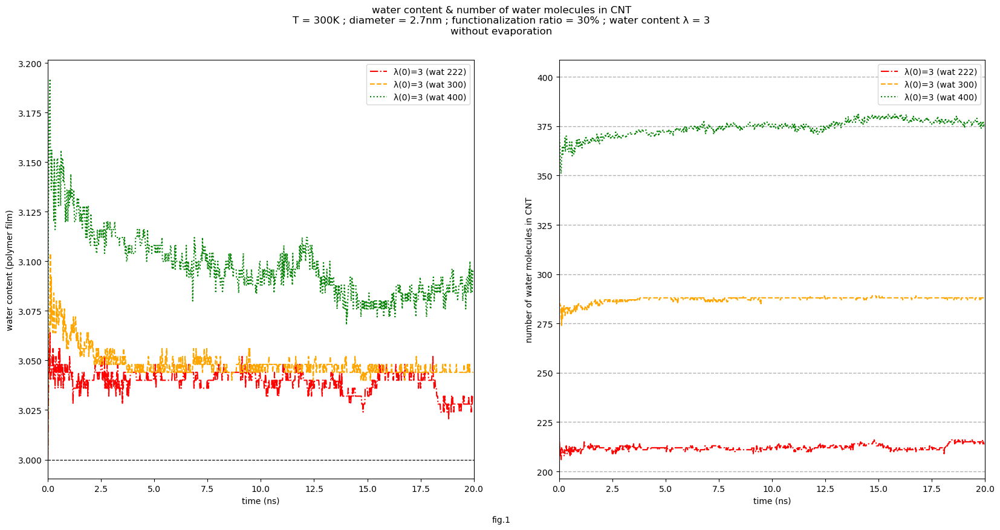

<< T=300; diameter=2.7nm, coh=30, λ = 7 >>
2


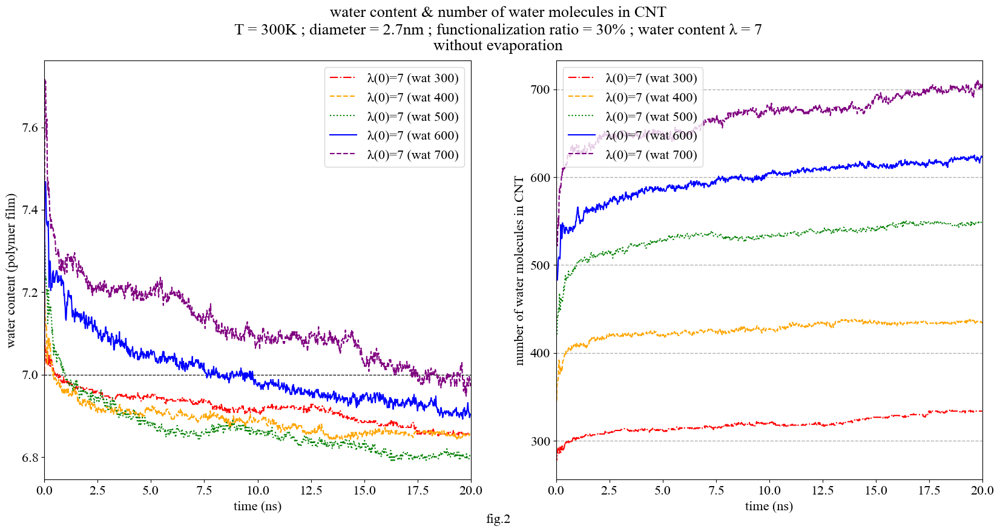

<< T=300; diameter=2.7nm, coh=30, λ = 11 >>
3


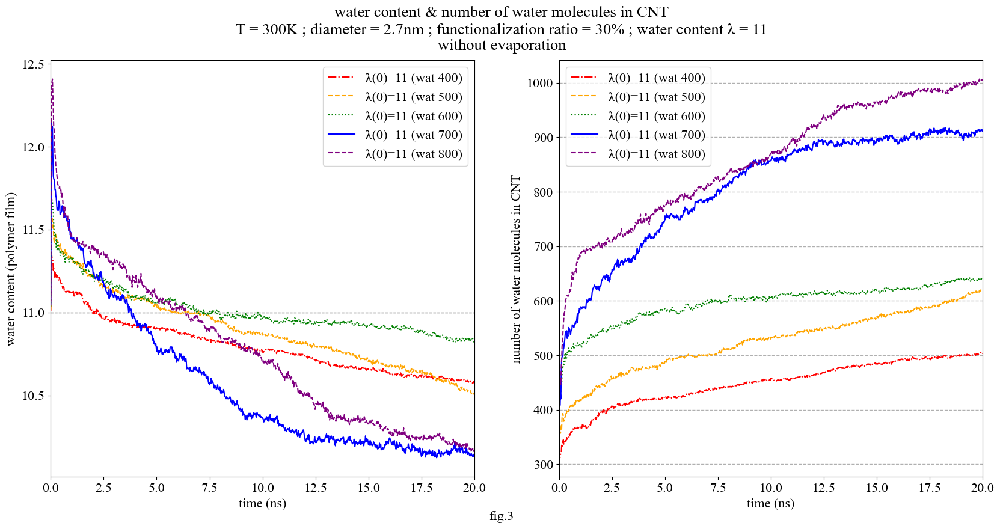

<< T=300; diameter=2.7nm, coh=40, λ = 3 >>
4


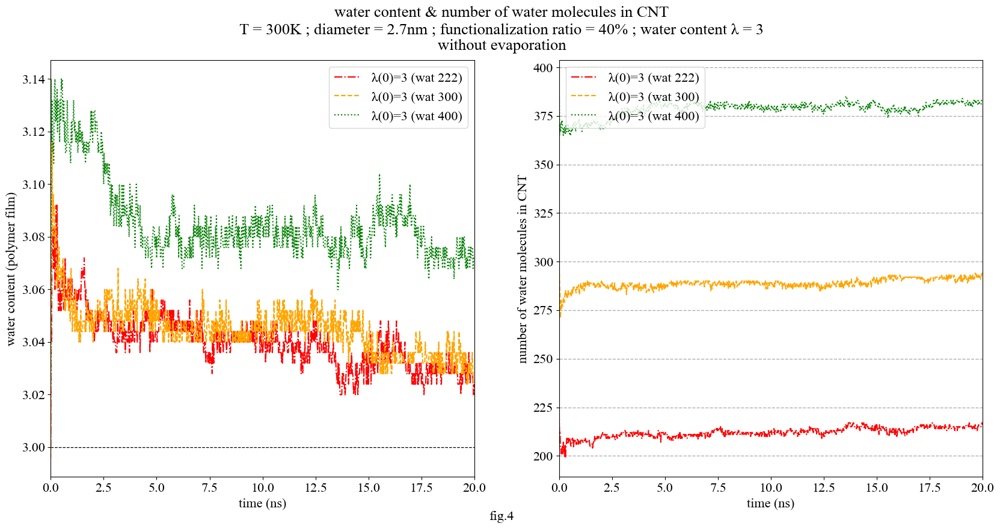

<< T=300; diameter=2.7nm, coh=40, λ = 7 >>
5


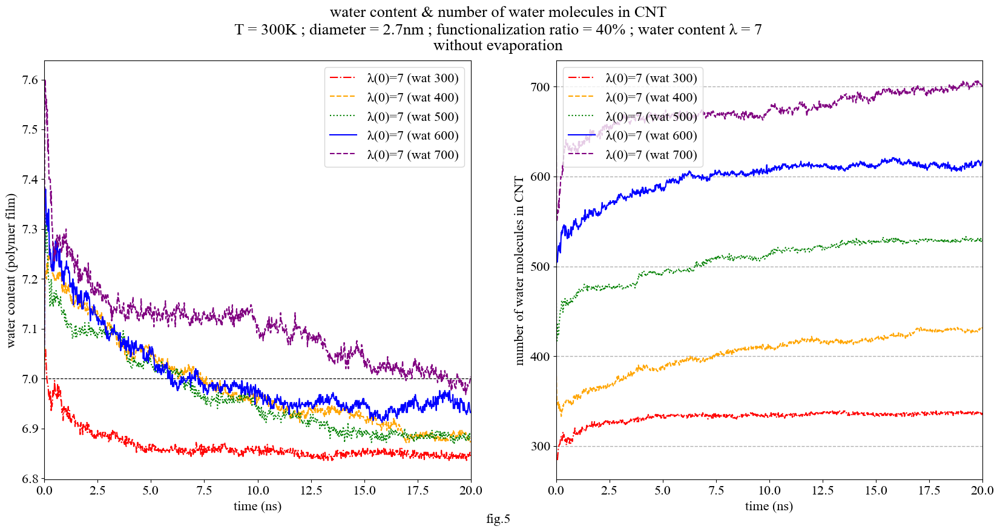

<< T=300; diameter=2.7nm, coh=40, λ = 11 >>
6


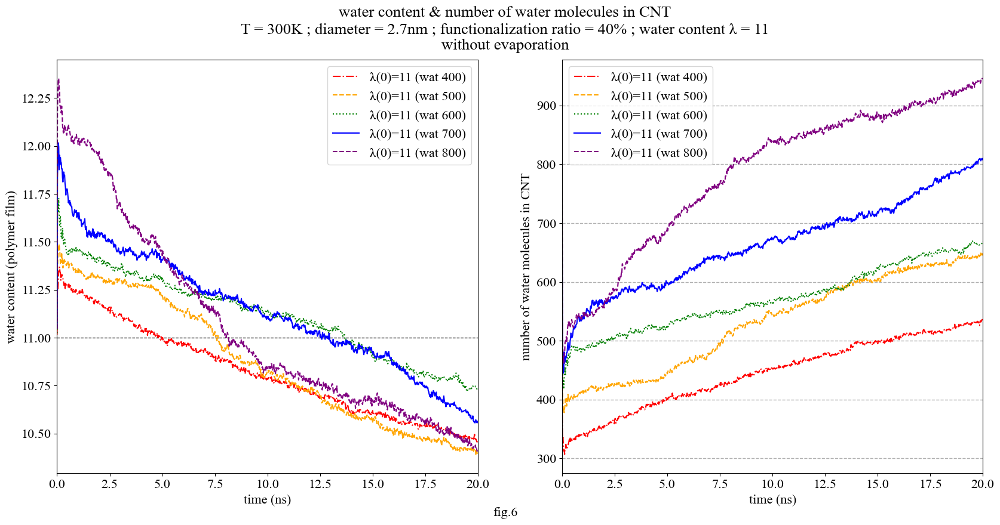

<< T=300; diameter=2.7nm, coh=50, λ = 3 >>
7


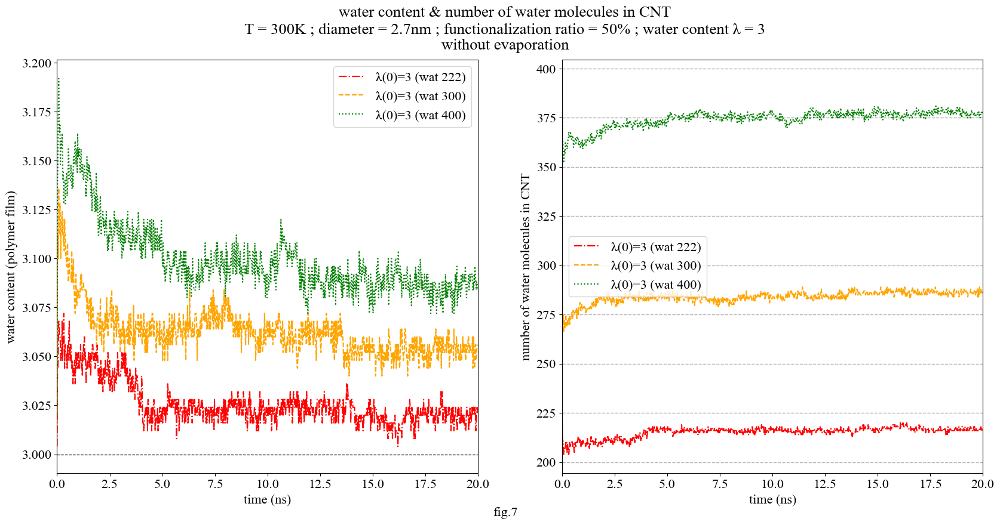

<< T=300; diameter=2.7nm, coh=50, λ = 7 >>
8


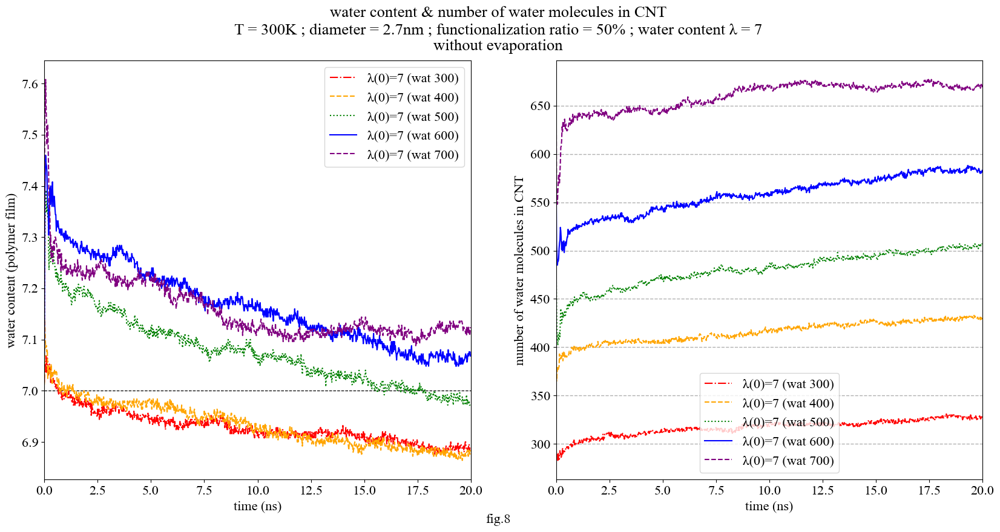

<< T=300; diameter=2.7nm, coh=50, λ = 11 >>
9


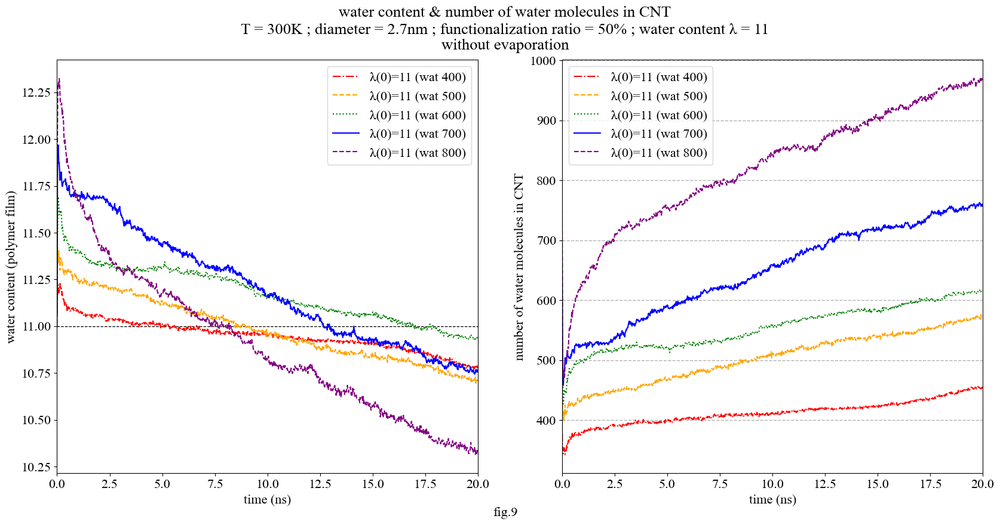

<< T=300; diameter=4.0nm, coh=30, λ = 3 >>
10


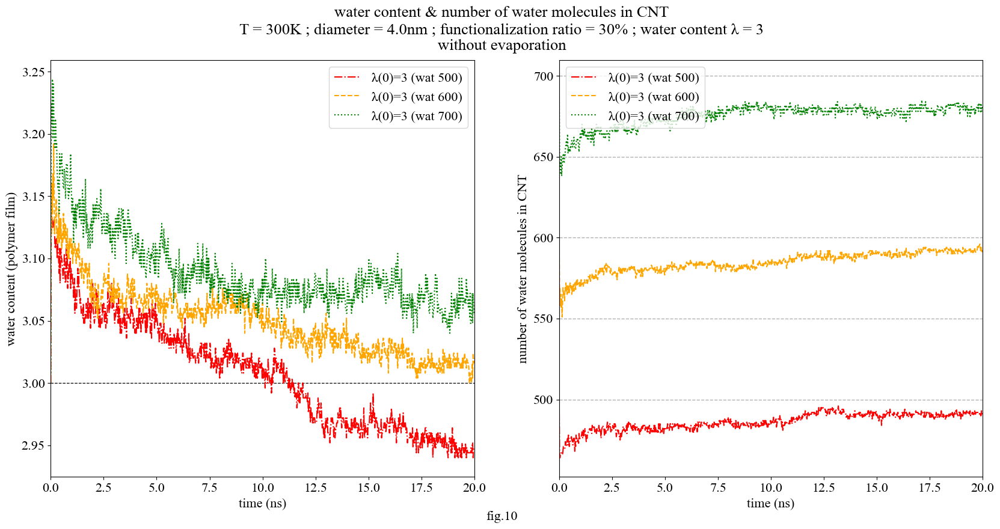

<< T=300; diameter=4.0nm, coh=30, λ = 7 >>
11


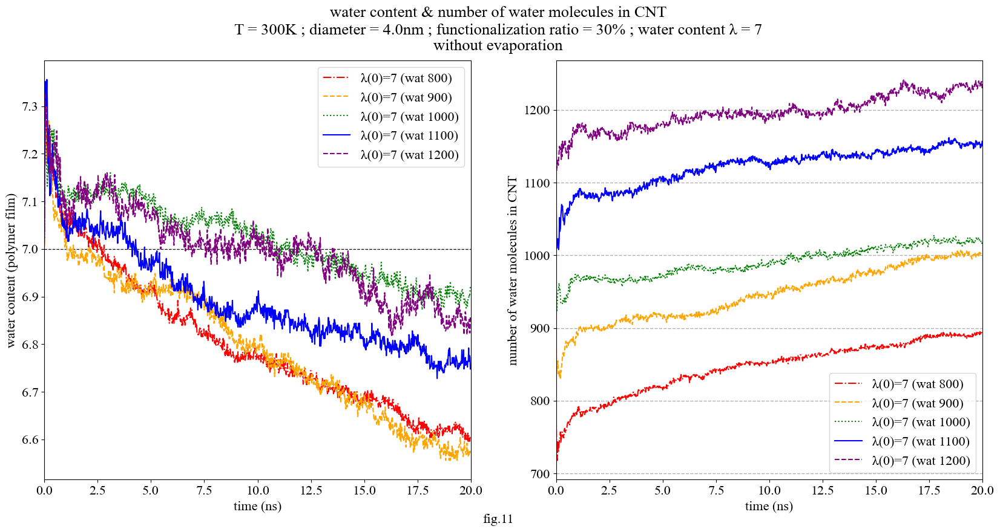

<< T=300; diameter=4.0nm, coh=30, λ = 11 >>
Key Error with df_Ow_nt30_coh15_nafl11_t300_wat1400 [number (water molecules above)]: Empty DataFrame

df_Ow_nt30_coh15_nafl7_t300_wat1400 [number (oxonium ions above)]: Empty DataFrame
df_Ow_nt30_coh15_nafl11_t300_wat1400 [number (water molecules in CNT)]: Empty DataFrame
Key Error with df_Ow_nt30_coh15_nafl11_t300_wat1500 [number (water molecules above)]: Empty DataFrame

df_Ow_nt30_coh15_nafl7_t300_wat1500 [number (oxonium ions above)]: Empty DataFrame
df_Ow_nt30_coh15_nafl11_t300_wat1500 [number (water molecules in CNT)]: Empty DataFrame
Key Error with df_Ow_nt30_coh15_nafl11_t300_wat1600 [number (water molecules above)]: Empty DataFrame

df_Ow_nt30_coh15_nafl7_t300_wat1600 [number (oxonium ions above)]: Empty DataFrame
df_Ow_nt30_coh15_nafl11_t300_wat1600 [number (water molecules in CNT)]: Empty DataFrame
12


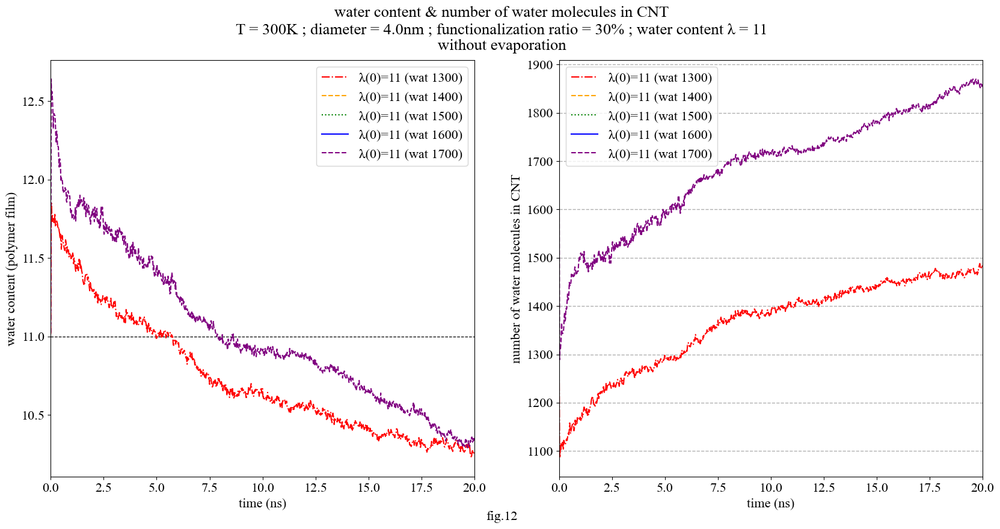

<< T=300; diameter=4.0nm, coh=40, λ = 3 >>
13


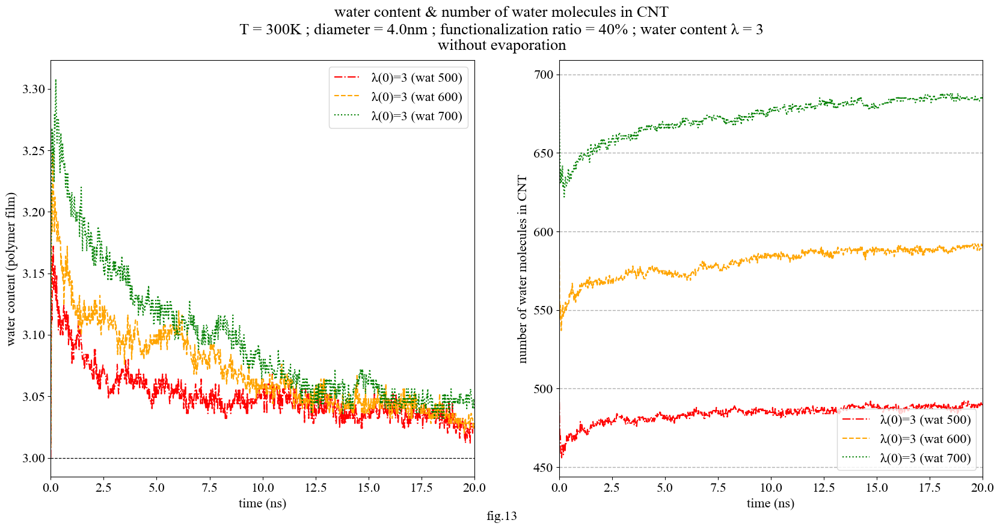

<< T=300; diameter=4.0nm, coh=40, λ = 7 >>
14


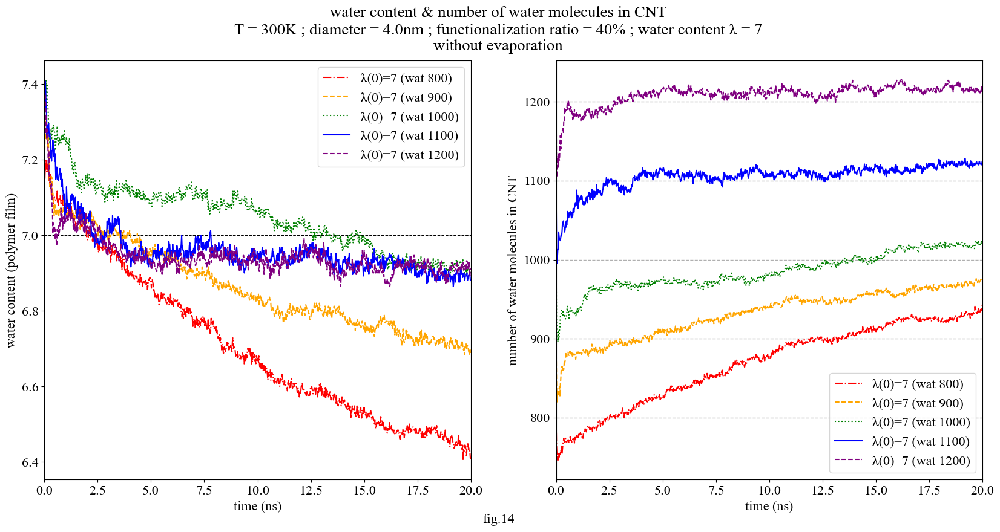

<< T=300; diameter=4.0nm, coh=40, λ = 11 >>
Key Error with df_Ow_nt30_coh20_nafl11_t300_wat1500 [number (water molecules above)]: Empty DataFrame

df_Ow_nt30_coh20_nafl7_t300_wat1500 [number (oxonium ions above)]: Empty DataFrame
df_Ow_nt30_coh20_nafl11_t300_wat1500 [number (water molecules in CNT)]: Empty DataFrame
Key Error with df_Ow_nt30_coh20_nafl11_t300_wat1600 [number (water molecules above)]: Empty DataFrame

df_Ow_nt30_coh20_nafl7_t300_wat1600 [number (oxonium ions above)]: Empty DataFrame
df_Ow_nt30_coh20_nafl11_t300_wat1600 [number (water molecules in CNT)]: Empty DataFrame
Key Error with df_Ow_nt30_coh20_nafl11_t300_wat1700 [number (water molecules above)]: Empty DataFrame

df_Ow_nt30_coh20_nafl7_t300_wat1700 [number (oxonium ions above)]: Empty DataFrame
df_Ow_nt30_coh20_nafl11_t300_wat1700 [number (water molecules in CNT)]: Empty DataFrame
15


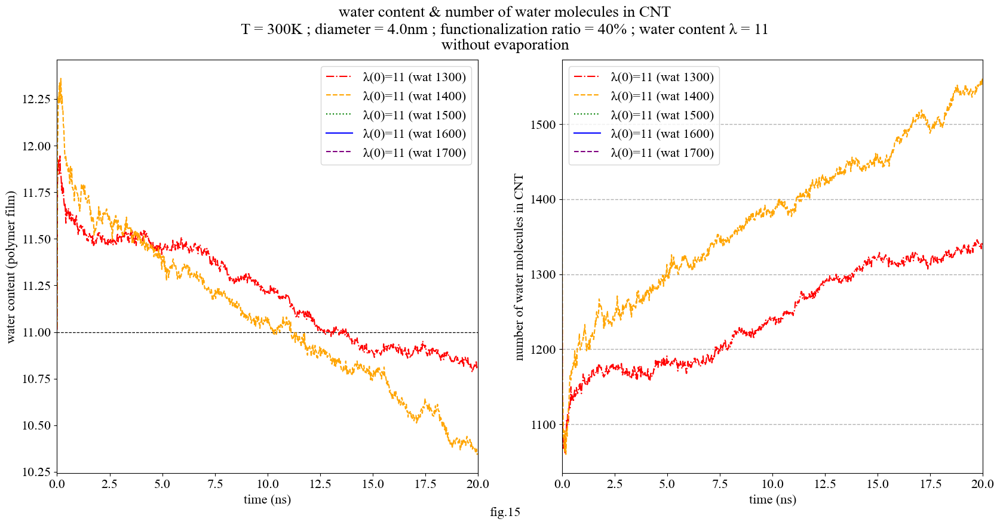

<< T=300; diameter=4.0nm, coh=50, λ = 3 >>
16


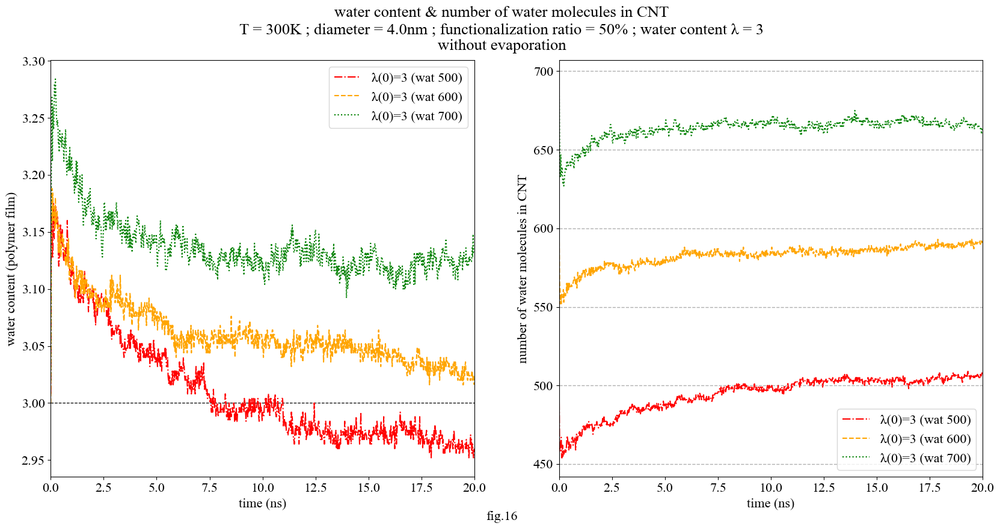

<< T=300; diameter=4.0nm, coh=50, λ = 7 >>
17


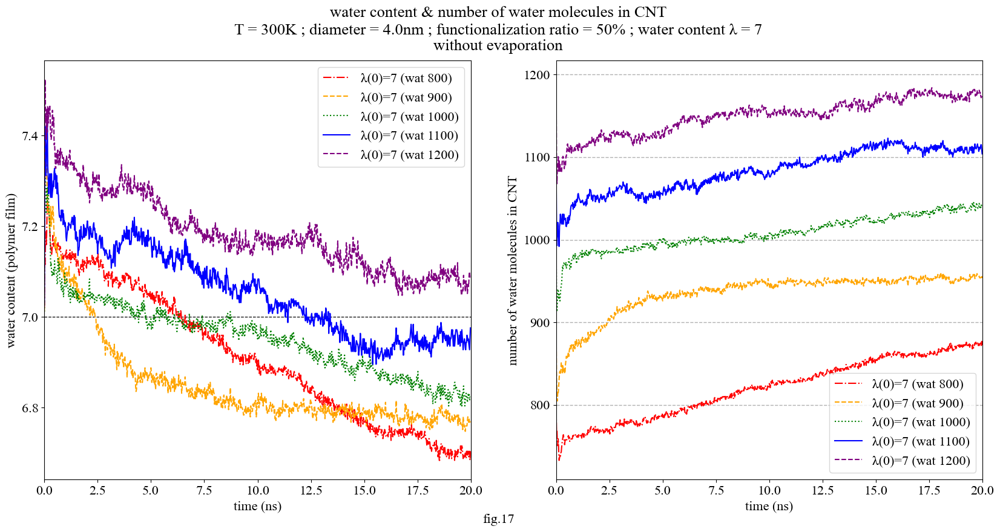

<< T=300; diameter=4.0nm, coh=50, λ = 11 >>
Key Error with df_Ow_nt30_coh25_nafl11_t300_wat1300 [number (water molecules above)]: Empty DataFrame

df_Ow_nt30_coh25_nafl7_t300_wat1300 [number (oxonium ions above)]: Empty DataFrame
df_Ow_nt30_coh25_nafl11_t300_wat1300 [number (water molecules in CNT)]: Empty DataFrame
Key Error with df_Ow_nt30_coh25_nafl11_t300_wat1400 [number (water molecules above)]: Empty DataFrame

df_Ow_nt30_coh25_nafl7_t300_wat1400 [number (oxonium ions above)]: Empty DataFrame
df_Ow_nt30_coh25_nafl11_t300_wat1400 [number (water molecules in CNT)]: Empty DataFrame
Key Error with df_Ow_nt30_coh25_nafl11_t300_wat1500 [number (water molecules above)]: Empty DataFrame

df_Ow_nt30_coh25_nafl7_t300_wat1500 [number (oxonium ions above)]: Empty DataFrame
df_Ow_nt30_coh25_nafl11_t300_wat1500 [number (water molecules in CNT)]: Empty DataFrame
Key Error with df_Ow_nt30_coh25_nafl11_t300_wat1600 [number (water molecules above)]: Empty DataFrame

df_Ow_nt30_coh25_nafl7_t300_wat

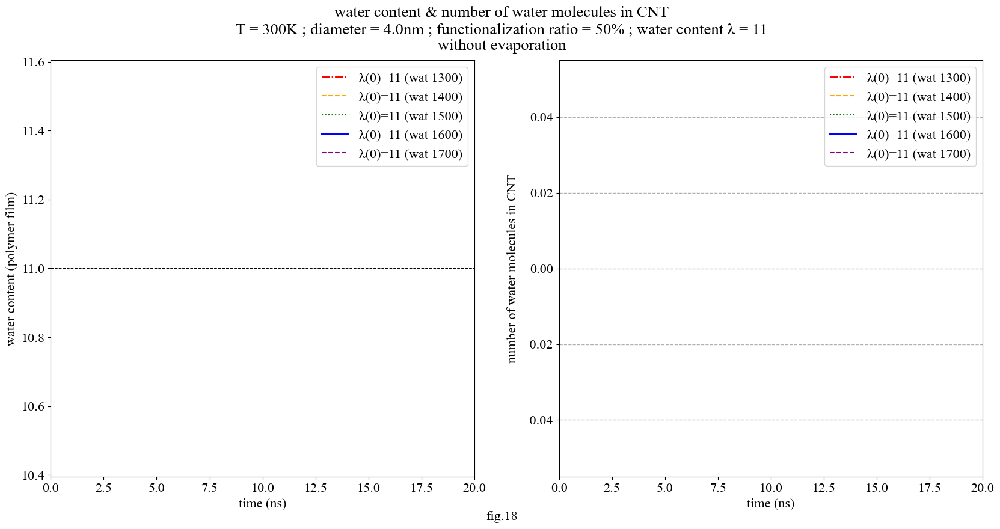

<< T=350; diameter=2.7nm, coh=30, λ = 3 >>
19


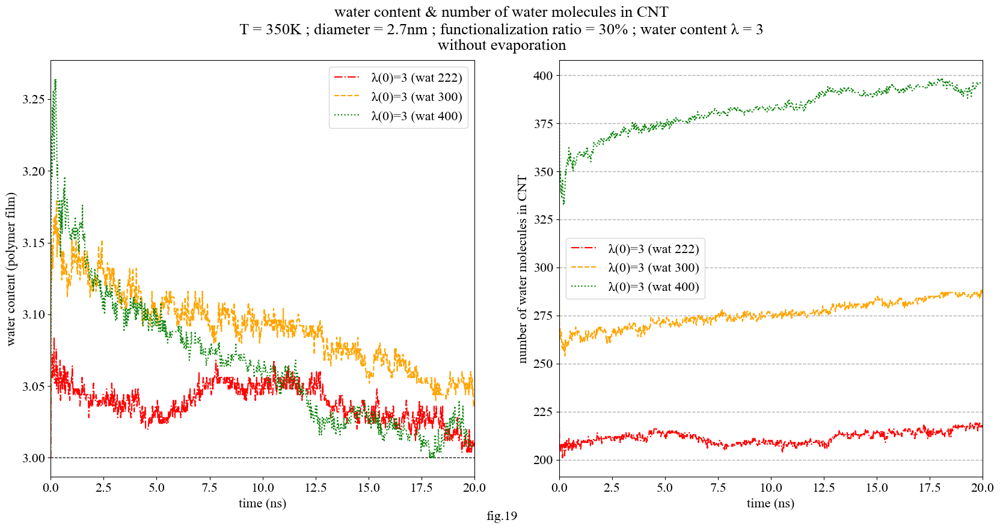

<< T=350; diameter=2.7nm, coh=30, λ = 7 >>
20


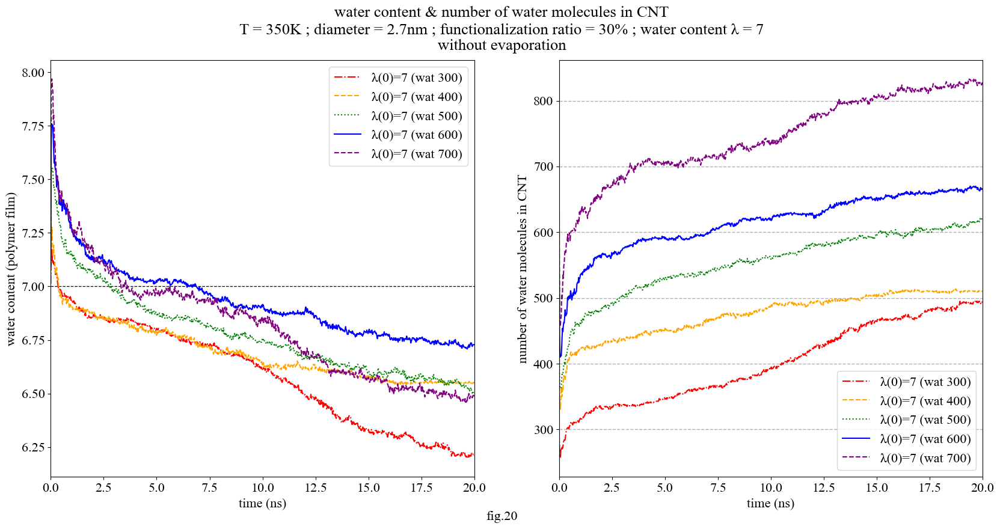

<< T=350; diameter=2.7nm, coh=30, λ = 11 >>
21


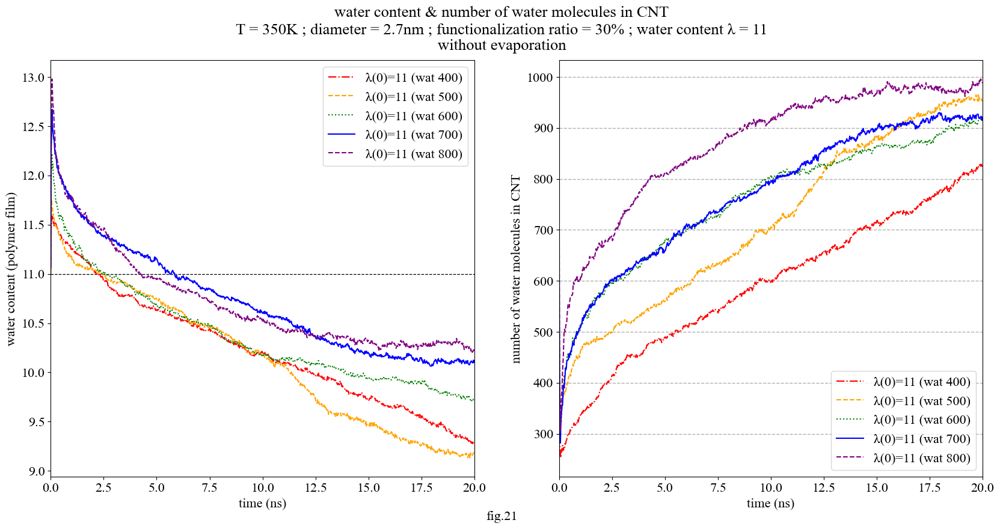

<< T=350; diameter=2.7nm, coh=40, λ = 3 >>
22


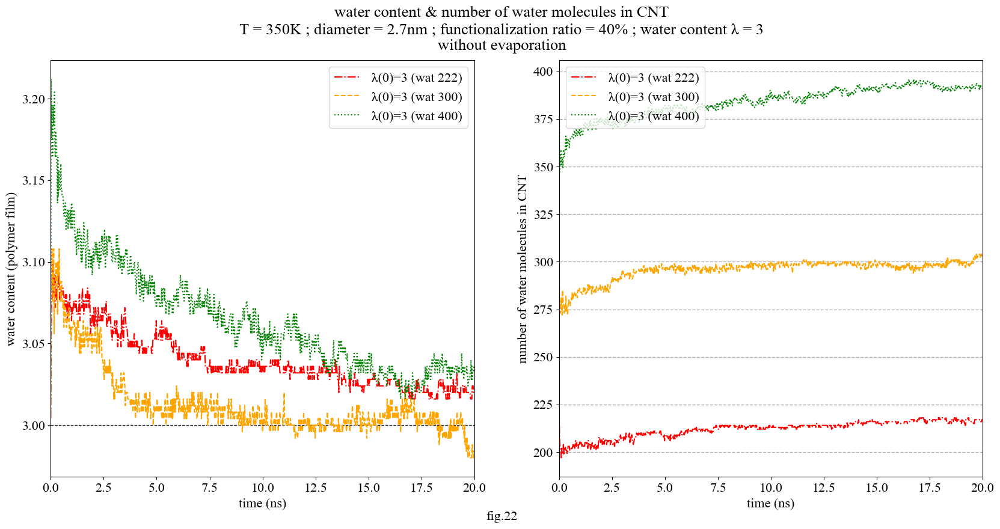

<< T=350; diameter=2.7nm, coh=40, λ = 7 >>
23


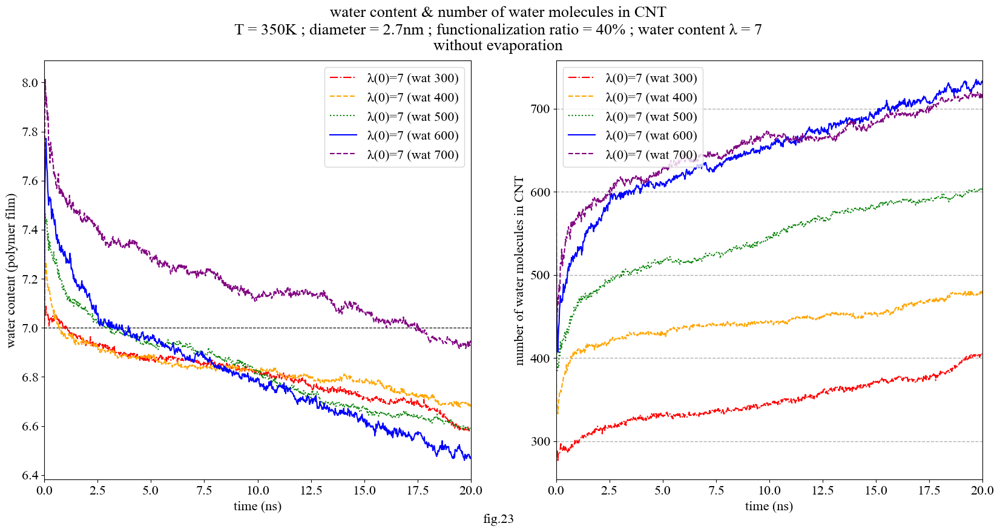

<< T=350; diameter=2.7nm, coh=40, λ = 11 >>
24


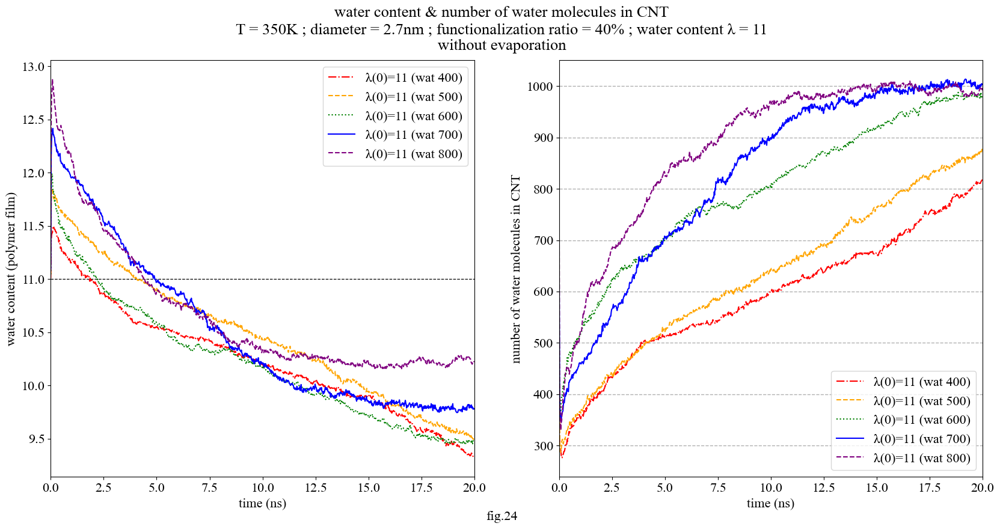

<< T=350; diameter=2.7nm, coh=50, λ = 3 >>
25


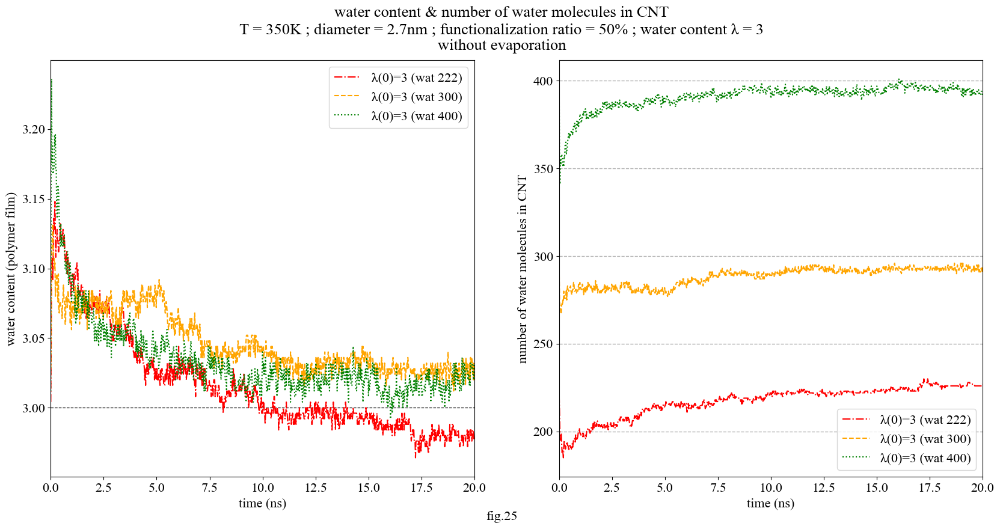

<< T=350; diameter=2.7nm, coh=50, λ = 7 >>
26


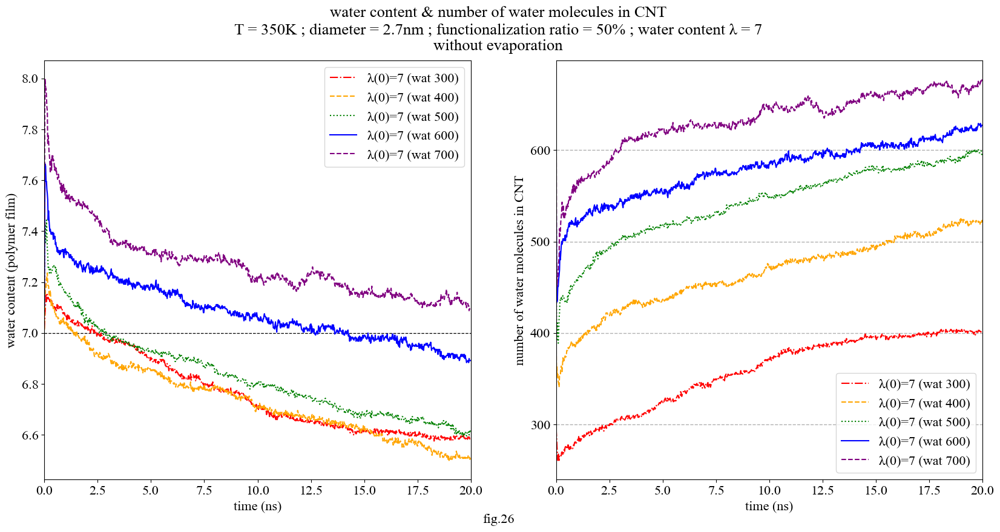

<< T=350; diameter=2.7nm, coh=50, λ = 11 >>
27


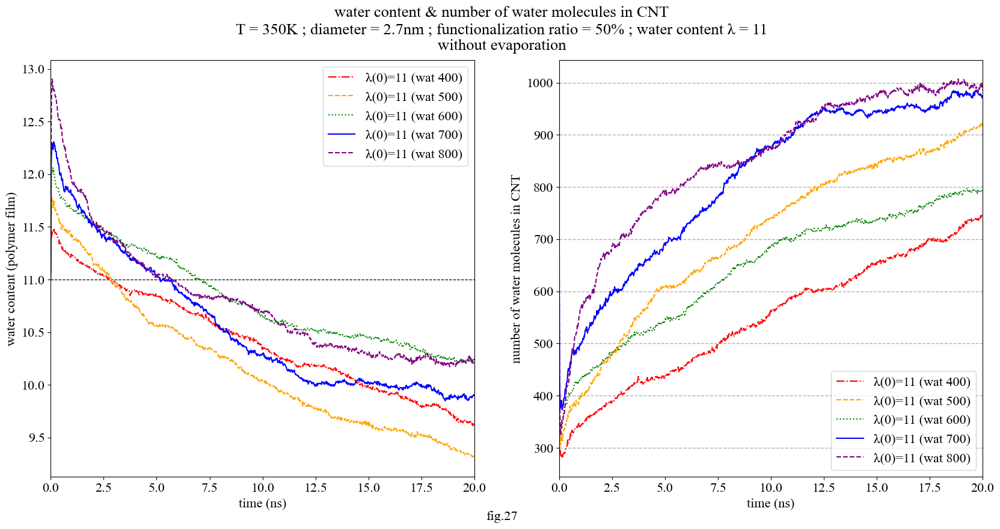

<< T=350; diameter=4.0nm, coh=30, λ = 3 >>
28


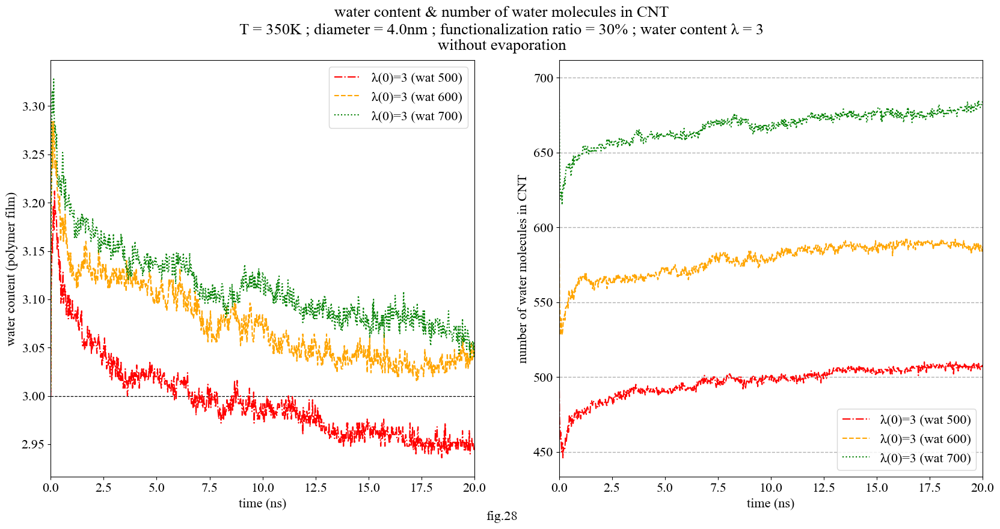

<< T=350; diameter=4.0nm, coh=30, λ = 7 >>
29


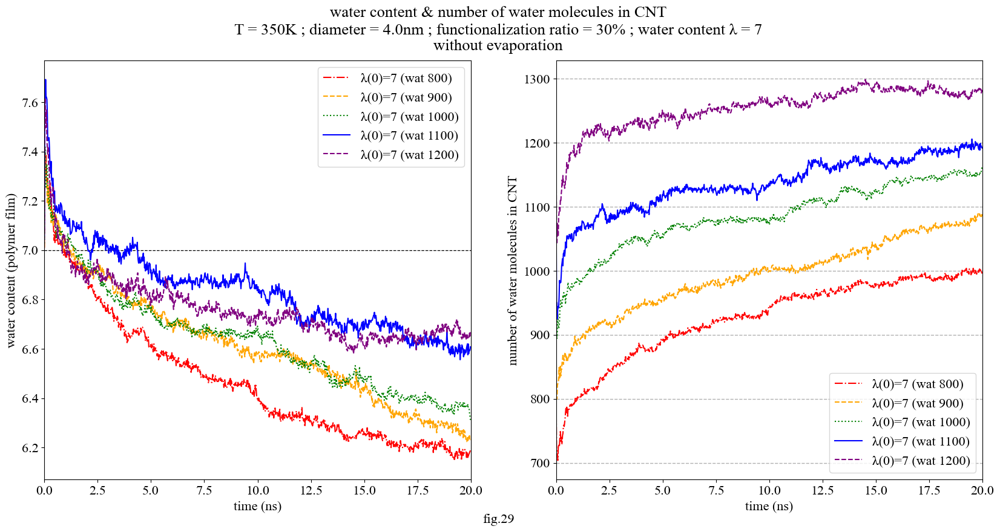

<< T=350; diameter=4.0nm, coh=30, λ = 11 >>
30


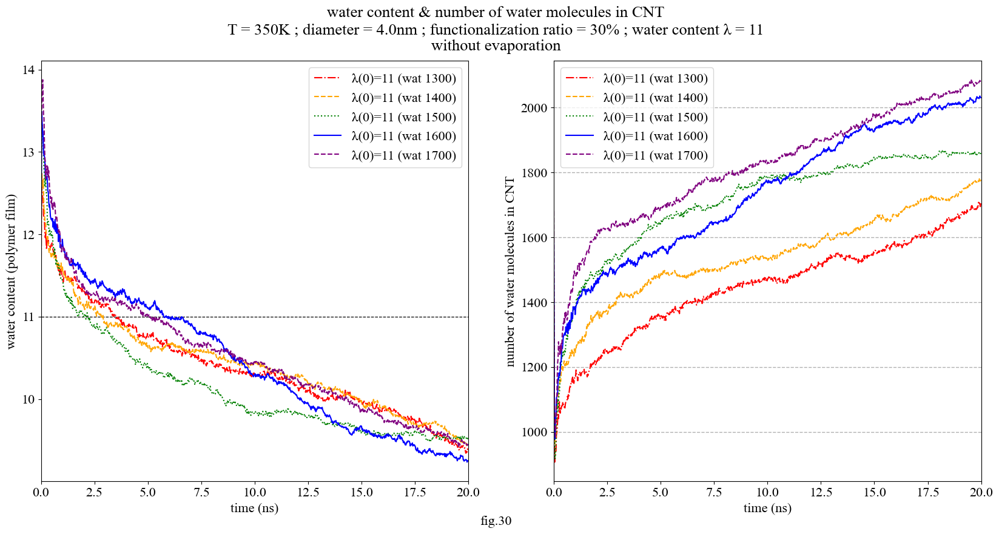

<< T=350; diameter=4.0nm, coh=40, λ = 3 >>
31


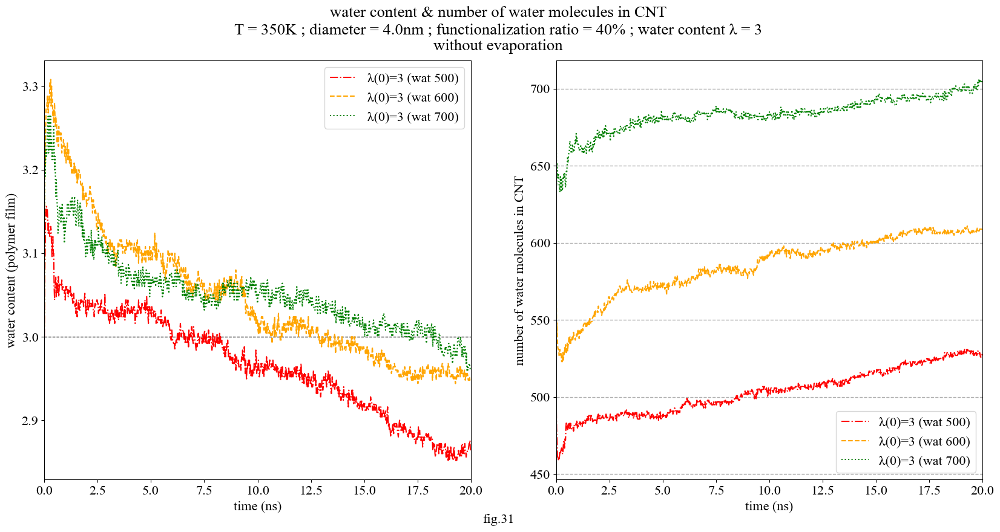

<< T=350; diameter=4.0nm, coh=40, λ = 7 >>
32


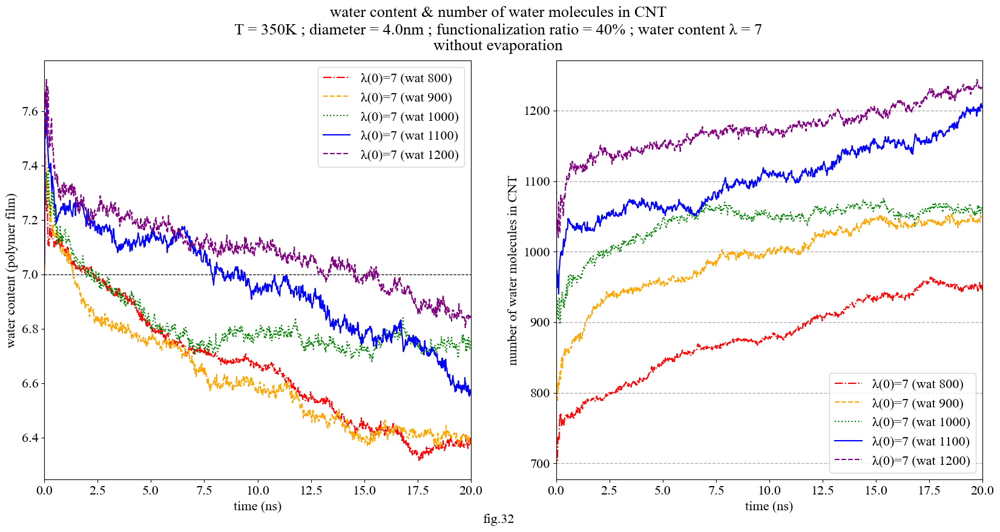

<< T=350; diameter=4.0nm, coh=40, λ = 11 >>
33


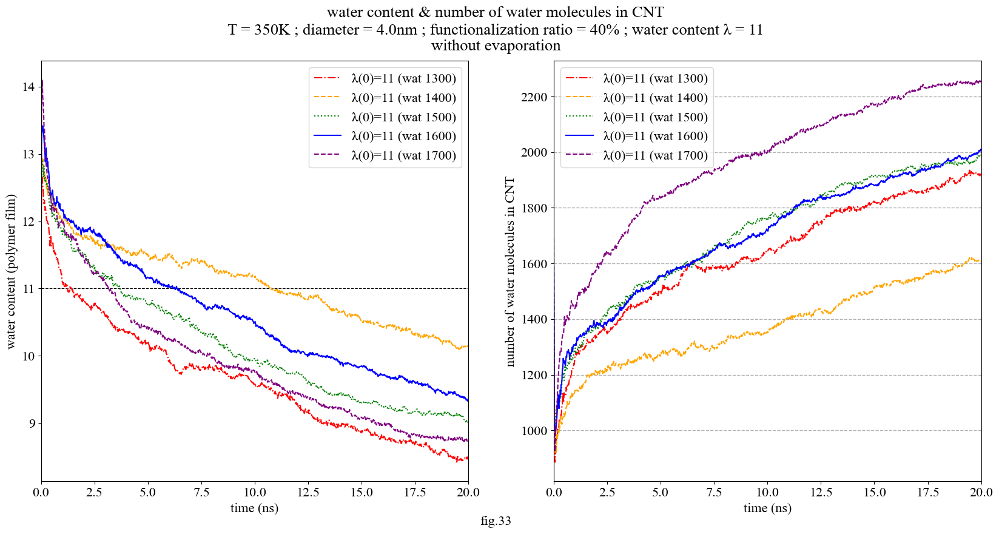

<< T=350; diameter=4.0nm, coh=50, λ = 3 >>
34


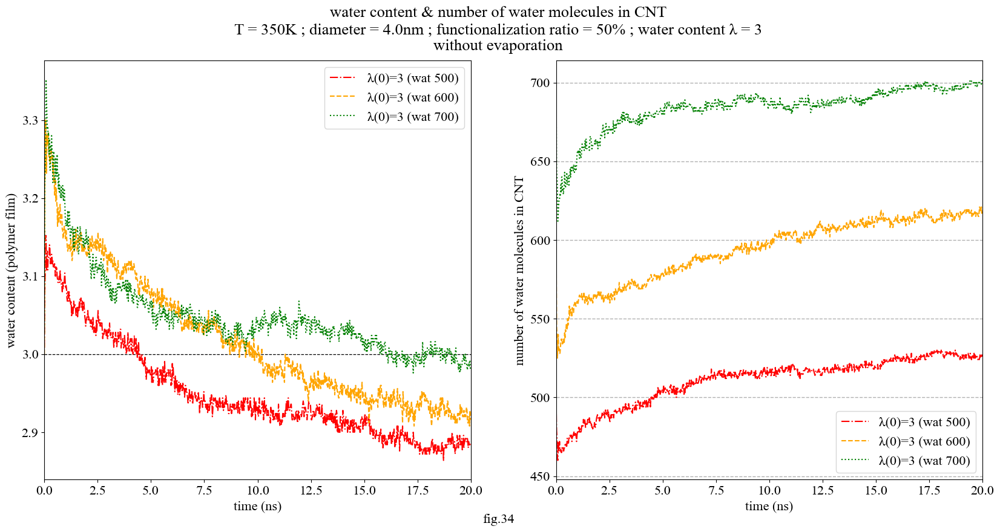

<< T=350; diameter=4.0nm, coh=50, λ = 7 >>
35


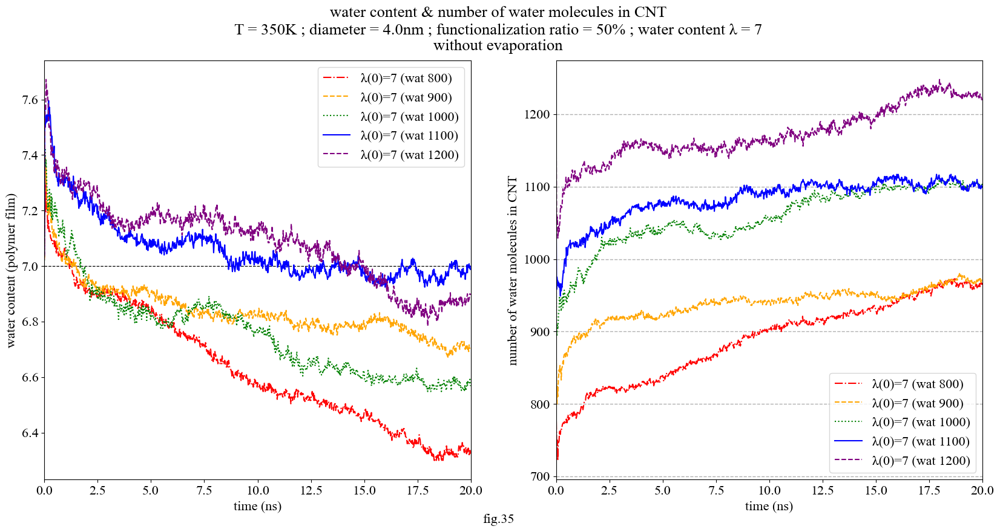

<< T=350; diameter=4.0nm, coh=50, λ = 11 >>
36


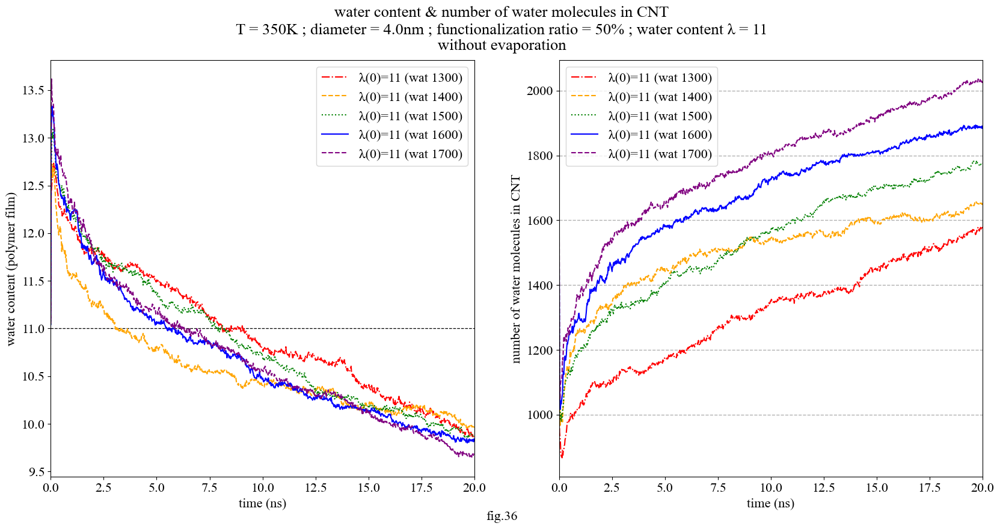

In [4]:

def wc_and_num_all():
    count = 1
    for t in range(len(temps)):
        for n in range(len(nts)):
            for c in range(len(cohs)): 
                for naf in range(len(nafls)):

                    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20,9))
                    fig.suptitle(f"water content & number of water molecules in CNT\nT = {temps[t]}K ; diameter = {Diameter[n]} ; functionalization ratio = {cohs[c]*2}% ; water content λ = {nafls[naf]}\nwithout evaporation\n\n")
                    fig.text(0.5, 0.03, f'fig.{count}', ha='center')
                    print(f"<< T={temps[t]}; diameter={Diameter[n]}, coh={cohs[c]*2}, λ = {nafls[naf]} >>")
                    
                    match nafls[naf]:
                        case 3:
                            fig.axes[0].axhline(y = 3,  color = 'Black', linestyle = '--', linewidth = 0.9)
                        case 7:
                            fig.axes[0].axhline(y = 7,  color = 'Black', linestyle = '--', linewidth = 0.9)
                        case 11:
                            fig.axes[0].axhline(y = 11, color = 'Black', linestyle = '--', linewidth = 0.9)

                    Y = [ [] for _ in range(2) ]  
                    
                    match (naf, n):
                        case (0, 0):
                            wats = wats03_nt20 
                        case (1, 0):
                            wats = wats07_nt20 
                        case (2, 0):
                            wats = wats11_nt20 
                        case (0, 1):
                            wats = wats03_nt30
                        case (1, 1):
                            wats = wats07_nt30
                        case (2, 1):
                            wats = wats11_nt30
                    


                    for w in range(len(wats)):
                
                        try:
                            num_Ow_above_tube = dicts_list[0][f"df_Ow_nt{nts[n]}_coh{cohs[c]}_nafl{nafls[naf]}_t{temps[t]}_wat{wats[w]}"]['number (water molecules)']
                            if num_Ow_above_tube.empty:
                                print(f"Key Error with df_Ow_nt{nts[n]}_coh{cohs[c]}_nafl{nafls[naf]}_t{temps[t]}_wat{wats[w]} [number (water molecules above)]: Empty DataFrame\n")
                                # continue
                        except KeyError:
                                continue
###########################################
                        try: 
                            num_Oh_above_tube = dicts_list[1][f"df_Ow_nt{nts[n]}_coh{cohs[c]}_nafl{nafls[naf]}_t{temps[t]}_wat{wats[w]}"]['number (oxonium ions)']
                            if num_Oh_above_tube.empty:
                                print(f"df_Ow_nt{nts[n]}_coh{cohs[c]}_nafl{nafls[n]}_t{temps[t]}_wat{wats[w]} [number (oxonium ions above)]: Empty DataFrame")
                                # continue
                        except KeyError:
                                continue

########################################
                        try:
                            num_Ow_in_tube =    dicts_list[2][f"df_Ow_nt{nts[n]}_coh{cohs[c]}_nafl{nafls[naf]}_t{temps[t]}_wat{wats[w]}"]['number (water molecules)']
                            if num_Ow_in_tube.empty:
                                print(f"df_Ow_nt{nts[n]}_coh{cohs[c]}_nafl{nafls[naf]}_t{temps[t]}_wat{wats[w]} [number (water molecules in CNT)]: Empty DataFrame")
                                # continue
                        except KeyError:
                                continue
                                #  continue
##########################################

                        Y[0].append( (num_Ow_above_tube + num_Oh_above_tube) / 250 )
                        Y[1].append( num_Ow_in_tube )

                    for w in range(len(wats)):
                        try:
                            # X_sampled = X[::sample_rate]
                            Y_sampled = Y[0][w][::sample_rate]
                            X = Y[0][w].index / 1000
                            X_sampled = X[::sample_rate]
                            axes[0].plot(X_sampled, Y_sampled, color=colors[w], linestyle=line_styles[w],label=f"λ(0)={nafls[naf]} (wat {wats[w]})")
                        except IndexError:
                            print("IndexError")
                            continue

                        try:
                            X_sampled = X[::sample_rate]
                            Y_sampled = Y[1][w][::sample_rate]
                            X = Y[1][w].index / 1000
                            X_sampled = X[::sample_rate]
                            axes[1].plot(X_sampled, Y_sampled, color=colors[w], linestyle=line_styles[w],label=f"λ(0)={nafls[naf]} (wat {wats[w]})")
                        except IndexError:
                            print("IndexError")
                            continue
##############################################################################                        
                    fig.axes[0].set_xlim((0,20))
                    fig.axes[0].legend()
                    fig.axes[0].set_xlabel('time (ns)')
                    fig.axes[0].set_ylabel('water content (polymer film)')

                    fig.axes[1].set_xlim((0,20))
                    fig.axes[1].legend()
                    fig.axes[1].set_xlabel('time (ns)')
                    fig.axes[1].set_ylabel('number of water molecules in CNT')
                    fig.axes[1].grid(axis='y',linestyle='dashed', linewidth=1)        
                    

                    plt.rcParams["font.family"] = "serif"
                    plt.rcParams["font.serif"] = ["Times New Roman"]
                    
                    matplotlib.rcParams.update({'font.size': 16})

                    print(count)
                    plt.show()
                    count = count+1

if __name__ == "__main__":
    Diameter = ("2.7nm", "4.0nm")
    nafls = (3, 7, 11) # CAUTION
    colors = ["Red","Orange","Green","Blue","Purple","Black","gray", "brown"]
    line_styles = ['-.', '--', ':', 'solid', 'dashed', 'dashdot', 'dotted', (0, (3, 10, 1, 10, 1, 10)),'loosely dashdotdotted']


    sample_rate = 20
    wc_and_num_all()

In [5]:
print(DataFrame_dict_Oh_in_tube)

{'df_Ow_nt20_coh15_nafl3_t300_wat222':        time (ns)  number (oxonium ions)
0          0.001                      0
1          0.002                      0
2          0.003                      0
3          0.004                      0
4          0.005                      0
...          ...                    ...
19995     19.996                      0
19996     19.997                      0
19997     19.998                      0
19998     19.999                      0
19999     20.000                      0

[20000 rows x 2 columns], 'df_Ow_nt20_coh15_nafl3_t300_wat300':        time (ns)  number (oxonium ions)
0          0.001                      0
1          0.002                      0
2          0.003                      0
3          0.004                      0
4          0.005                      0
...          ...                    ...
19995     19.996                      1
19996     19.997                      1
19997     19.998                      0
19998     19.999

In [6]:
expected_rows = 20000

def Ow_above_tube_final(key):
    # wat_mol_evap = DataFrame_dict_Ow_entire[f"df_Ow_nt{nt}_coh{coh}_nafl{nafl}_t{temp}_wat{wat}"]['number (water molecules)']
    if DataFrame_dict_Ow_above_tube[key].shape[0] == expected_rows:
        Ow_above_tube = DataFrame_dict_Ow_above_tube[key]['number (water molecules)']
        num_Ow_above_tube_initial  = list(Ow_above_tube)[0]
        num_Ow_above_tube_final    = list(Ow_above_tube)[-1]
        return num_Ow_above_tube_final
    else:
        pass

def Ow_above_tube_last_1ns_mean(key):
    # wat_mol_evap = DataFrame_dict_Ow_entire[f"df_Ow_nt{nt}_coh{coh}_nafl{nafl}_t{temp}_wat{wat}"]['number (water molecules)']
    if DataFrame_dict_Ow_above_tube[key].shape[0] == expected_rows:
        Ow_above_tube = DataFrame_dict_Ow_above_tube[key]['number (water molecules)']
        num_Ow_above_tube_last_1ns = np.mean(list(Ow_above_tube)[-2000:])
        
        return num_Ow_above_tube_final
    else:
        pass
#################
def Oh_above_tube_final(key):
    # wat_mol_evap = DataFrame_dict_Ow_entire[f"df_Ow_nt{nt}_coh{coh}_nafl{nafl}_t{temp}_wat{wat}"]['number (oxonium ions)']
    if DataFrame_dict_Oh_above_tube[key].shape[0] == expected_rows:
        Oh_above_tube = DataFrame_dict_Oh_above_tube[key]['number (oxonium ions)']
        num_Oh_above_tube_initial  = list(Oh_above_tube)[0]
        num_Oh_above_tube_final    = list(Oh_above_tube)[-1]
        num_Oh_above_tube_last_1ns = np.mean(list(Oh_above_tube)[-2000:])
        return num_Oh_above_tube_final
    else:
        pass
    
def Oh_above_tube_last_1ns_mean(key):
    # wat_mol_evap = DataFrame_dict_Ow_entire[f"df_Ow_nt{nt}_coh{coh}_nafl{nafl}_t{temp}_wat{wat}"]['number (oxonium ions)']
    if DataFrame_dict_Oh_above_tube[key].shape[0] == expected_rows:
        Oh_above_tube = DataFrame_dict_Oh_above_tube[key]['number (oxonium ions)']
        num_Oh_above_tube_last_1ns_mean = np.mean(list(Oh_above_tube)[-2000:])
        return num_Oh_above_tube_last_1ns_mean
    else:
        pass
    
##############################################
def Ow_in_tube_final(key):
    # wat_mol_evap = DataFrame_dict_Ow_entire[f"df_Ow_nt{nt}_coh{coh}_nafl{nafl}_t{temp}_wat{wat}"]['number (water molecules)']
    if DataFrame_dict_Ow_in_tube[key].shape[0] == expected_rows:
        Ow_in_tube = DataFrame_dict_Ow_in_tube[key]['number (water molecules)']
        num_Ow_in_tube_initial = list(Ow_in_tube)[0]
        num_Ow_in_tube_final   = list(Ow_in_tube)[-1]
        return num_Ow_in_tube_final
    else:
        pass

def Ow_in_tube_last_1ns_mean(key):
    # wat_mol_evap = DataFrame_dict_Ow_entire[f"df_Ow_nt{nt}_coh{coh}_nafl{nafl}_t{temp}_wat{wat}"]['number (water molecules)']
    if DataFrame_dict_Ow_in_tube[key].shape[0] == expected_rows:
        Ow_in_tube = DataFrame_dict_Ow_in_tube[key]['number (water molecules)']
        num_Ow_in_tube_last_1ns_mean  = np.mean(list(Ow_in_tube)[-2000:])
        return num_Ow_in_tube_last_1ns_mean
    else:
        pass
#################

def Oh_in_tube_final(key):
    # wat_mol_evap = DataFrame_dict_Oh_entire[f"df_Oh_nt{nt}_coh{coh}_nafl{nafl}_t{temp}_wat{wat}"]['number (oxonium ions)']
    if DataFrame_dict_Oh_in_tube[key].shape[0] == expected_rows:
        Oh_in_tube = DataFrame_dict_Oh_in_tube[key]['number (oxonium ions)']
        num_Oh_in_tube_initial = list(Oh_in_tube)[0]
        num_Oh_in_tube_final   = list(Oh_in_tube)[-1]
        return num_Oh_in_tube_final
    else:
        pass

def Oh_in_tube_last_1ns_mean(key):
    # wat_mol_evap = DataFrame_dict_Ow_entire[f"df_Ow_nt{nt}_coh{coh}_nafl{nafl}_t{temp}_wat{wat}"]['number (oxonium ions)']
    if DataFrame_dict_Oh_above_tube[key].shape[0] == expected_rows:
        Oh_in_tube = DataFrame_dict_Oh_above_tube[key]['number (oxonium ions)']
        Oh_in_tube_last_1ns_mean = np.mean(list(Oh_in_tube)[-2000:])
        return Oh_in_tube_last_1ns_mean
    else:
        pass
############################
############################
def water_content(key):
    if ((DataFrame_dict_Ow_above_tube[key].shape[0] == expected_rows) and (DataFrame_dict_Oh_above_tube[key].shape[0] == expected_rows)):
        Ow_above_tube = np.array(DataFrame_dict_Ow_above_tube[key]['number (water molecules)'])
        Oh_above_tube = np.array(DataFrame_dict_Oh_above_tube[key]['number (oxonium ions)'])
        return (Ow_above_tube + Oh_above_tube) / 250

    
################################################
################################################
################################################

def water_content_final(key):
    if ((DataFrame_dict_Ow_above_tube[key].shape[0] == expected_rows) and (DataFrame_dict_Oh_above_tube[key].shape[0] == expected_rows)): 
        return (Ow_above_tube_final(key) + Oh_above_tube_final(key)) / 250
    else:
        pass

def num_of_water_molecules_in_CNT_final(key):
    if ((DataFrame_dict_Ow_above_tube[key].shape[0] == expected_rows) and (DataFrame_dict_Oh_above_tube[key].shape[0] == expected_rows)): 
        return Ow_in_tube_final(key) 
    else:
        pass

################################################


def num_of_water_molecules_in_CNT_last_1ns_mean(key):
    if ((DataFrame_dict_Ow_above_tube[key].shape[0] == expected_rows) and (DataFrame_dict_Oh_above_tube[key].shape[0] == expected_rows)): 
        return Ow_in_tube_last_1ns_mean(key) 
    else:
        pass
    
############################
############################

def water_content_last_1ns_mean(key):
    if ((DataFrame_dict_Ow_above_tube[key].shape[0] == expected_rows) and (DataFrame_dict_Oh_above_tube[key].shape[0] == expected_rows)):
        return np.mean(water_content(key)[-2000:])

# print(Oh_above_tube_final("df_Ow_nt20_coh15_nafl3_t300_wat200"))
# print(water_content_last_1ns_mean("df_Ow_nt20_coh15_nafl3_t300_wat200"))

In [7]:
"""
water_content_and_num_of_water_molecules_in_CNT_at_20ns = pd.DataFrame(columns=["nt", "coh",  "nafl", "temp", "wat", "water_content_fin","num_of_water_molecules_in_CNT_fin"])


for key in DataFrame_dict_Ow_above_tube :
    pattern = r'\d+'
    matches = re.findall(pattern, key)
    numbers = [int(match) for match in matches]
    numbers.append(water_content_final(key))
    numbers.append(num_of_water_molecules_in_CNT_final(key))
    # print(numbers)
    numbers_dict = dict(zip(water_content_and_num_of_water_molecules_in_CNT_at_20ns.columns, numbers))
    numbers_df = pd.DataFrame([numbers_dict])
    water_content_and_num_of_water_molecules_in_CNT_at_20ns = pd.concat([water_content_and_num_of_water_molecules_in_CNT_at_20ns,numbers_df], ignore_index=True)

# water_content_and_num_of_water_molecules_in_CNT_at_20ns.groupby(['temp', 'coh'])
"""

'\nwater_content_and_num_of_water_molecules_in_CNT_at_20ns = pd.DataFrame(columns=["nt", "coh",  "nafl", "temp", "wat", "water_content_fin","num_of_water_molecules_in_CNT_fin"])\n\n\nfor key in DataFrame_dict_Ow_above_tube :\n    pattern = r\'\\d+\'\n    matches = re.findall(pattern, key)\n    numbers = [int(match) for match in matches]\n    numbers.append(water_content_final(key))\n    numbers.append(num_of_water_molecules_in_CNT_final(key))\n    # print(numbers)\n    numbers_dict = dict(zip(water_content_and_num_of_water_molecules_in_CNT_at_20ns.columns, numbers))\n    numbers_df = pd.DataFrame([numbers_dict])\n    water_content_and_num_of_water_molecules_in_CNT_at_20ns = pd.concat([water_content_and_num_of_water_molecules_in_CNT_at_20ns,numbers_df], ignore_index=True)\n\n# water_content_and_num_of_water_molecules_in_CNT_at_20ns.groupby([\'temp\', \'coh\'])\n'

In [8]:
water_content_and_num_of_water_molecules_in_CNT_last_1ns_mean = pd.DataFrame(columns=["nt", 
                                                                                      "coh",  
                                                                                      "nafl", 
                                                                                      "temp", 
                                                                                      "wat", 
                                                                                      "water_content_last_1ns_mean",
                                                                                      "num_of_water_molecules_in_CNT_last_1ns_mean",
                                                                                     ])


for key in DataFrame_dict_Ow_above_tube :
    pattern = r'\d+'
    matches = re.findall(pattern, key)
    numbers = [int(match) for match in matches]
    numbers.append(water_content_last_1ns_mean(key))
    numbers.append(num_of_water_molecules_in_CNT_last_1ns_mean(key))
    numbers_dict = dict(zip(water_content_and_num_of_water_molecules_in_CNT_last_1ns_mean.columns, numbers))
    numbers_df = pd.DataFrame([numbers_dict])
    water_content_and_num_of_water_molecules_in_CNT_last_1ns_mean = pd.concat([water_content_and_num_of_water_molecules_in_CNT_last_1ns_mean,numbers_df], ignore_index=True)

# water_content_and_num_of_water_molecules_in_CNT_last_1ns_mean=water_content_and_num_of_water_molecules_in_CNT_last_1ns_mean.groupby(['temp', 'coh'])

/tmp/ipykernel_1731/518615472.py:19: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  water_content_and_num_of_water_molecules_in_CNT_last_1ns_mean = pd.concat([water_content_and_num_of_water_molecules_in_CNT_last_1ns_mean,numbers_df], ignore_index=True)


In [9]:
DF=water_content_and_num_of_water_molecules_in_CNT_last_1ns_mean
tolerance_wc  = 0.10
tolerance_wat = 0.10
condition = (( DF["water_content_last_1ns_mean"] >= (1 - tolerance_wc) * DF["nafl"] )  &  \
             ( DF["water_content_last_1ns_mean"] <= (1 + tolerance_wc) * DF["nafl"] )) & \
            (( DF["num_of_water_molecules_in_CNT_last_1ns_mean"] >= (1 - tolerance_wat) * DF["wat"] ) & \
             ( DF["num_of_water_molecules_in_CNT_last_1ns_mean"] <= (1 + tolerance_wat) * DF["wat"]))
DF = DF[condition]

/home/user0/anaconda3/lib/python3.11/site-packages/pandas/core/computation/expressions.py:73: RuntimeWarning: invalid value encountered in greater_equal
  return op(a, b)
/home/user0/anaconda3/lib/python3.11/site-packages/pandas/core/computation/expressions.py:73: RuntimeWarning: invalid value encountered in less_equal
  return op(a, b)


In [10]:
DF

,nt,coh,nafl,temp,wat,water_content_last_1ns_mean,num_of_water_molecules_in_CNT_last_1ns_mean
0,20,15,3,300,222,3.029336,214.6625
1,20,15,3,300,300,3.044680,287.9065
2,20,15,3,300,400,3.087364,376.8935
3,20,20,3,300,222,3.028402,214.8995
4,20,20,3,300,300,3.032506,291.8735
...,...,...,...,...,...,...,...
134,30,20,7,350,1100,6.635796,1187.6320
135,30,20,7,350,1200,6.863464,1228.7015
137,30,25,7,350,900,6.707688,970.7455
139,30,25,7,350,1100,6.974724,1104.7970


In [11]:
"""
condition_temp300_nt20 = (DF["temp"] == 300) & (DF["nt"] == 20) & ( (DF["nafl"] == 3) | (DF["nafl"] == 7)  )
DF_t300_nt20 = DF[condition_temp300_nt20]

condition_temp300_nt30 = (DF["temp"] == 300) & (DF["nt"] == 30) & ( (DF["nafl"] == 3) | (DF["nafl"] == 7)  )
DF_t300_nt30 = DF[condition_temp300_nt30]

condition_temp350_nt20 = (DF["temp"] == 350) & (DF["nt"] == 20) & ( (DF["nafl"] == 3) | (DF["nafl"] == 7)  )
DF_t350_nt20 = DF[condition_temp350_nt20]

condition_temp350_nt30 = (DF["temp"] == 350) & (DF["nt"] == 30) & ( (DF["nafl"] == 3) | (DF["nafl"] == 7)  )
DF_t350_nt30 = DF[condition_temp350_nt30]
"""

'\ncondition_temp300_nt20 = (DF["temp"] == 300) & (DF["nt"] == 20) & ( (DF["nafl"] == 3) | (DF["nafl"] == 7)  )\nDF_t300_nt20 = DF[condition_temp300_nt20]\n\ncondition_temp300_nt30 = (DF["temp"] == 300) & (DF["nt"] == 30) & ( (DF["nafl"] == 3) | (DF["nafl"] == 7)  )\nDF_t300_nt30 = DF[condition_temp300_nt30]\n\ncondition_temp350_nt20 = (DF["temp"] == 350) & (DF["nt"] == 20) & ( (DF["nafl"] == 3) | (DF["nafl"] == 7)  )\nDF_t350_nt20 = DF[condition_temp350_nt20]\n\ncondition_temp350_nt30 = (DF["temp"] == 350) & (DF["nt"] == 30) & ( (DF["nafl"] == 3) | (DF["nafl"] == 7)  )\nDF_t350_nt30 = DF[condition_temp350_nt30]\n'

In [12]:
# DF_t350_nt30

In [13]:
# DF=water_content_and_num_of_water_molecules_in_CNT_last_1ns_mean

####################################################

condition_temp300_nt20_wt3 = (DF["temp"] == 300) & (DF["nt"] == 20) & (DF["nafl"] == 3)
DF_t300_nt20_wt3 = DF[condition_temp300_nt20_wt3]

condition_temp300_nt20_wt7 = (DF["temp"] == 300) & (DF["nt"] == 20) & (DF["nafl"] == 7)
DF_t300_nt20_wt7 = DF[condition_temp300_nt20_wt7]

####################################################

condition_temp300_nt30_wt3 = (DF["temp"] == 300) & (DF["nt"] == 30) & (DF["nafl"] == 3)
DF_t300_nt30_wt3 = DF[condition_temp300_nt30_wt3]

condition_temp300_nt30_wt7 = (DF["temp"] == 300) & (DF["nt"] == 30) & (DF["nafl"] == 7)
DF_t300_nt30_wt7 = DF[condition_temp300_nt30_wt7]

####################################################

condition_temp350_nt20_wt3 = (DF["temp"] == 350) & (DF["nt"] == 20) & (DF["nafl"] == 3) 
DF_t350_nt20_wt3 = DF[condition_temp350_nt20_wt3]

condition_temp350_nt20_wt7 = (DF["temp"] == 350) & (DF["nt"] == 20) & (DF["nafl"] == 7) 
DF_t350_nt20_wt7 = DF[condition_temp350_nt20_wt7]

####################################################

condition_temp350_nt30_wt3 = (DF["temp"] == 350) & (DF["nt"] == 30) & (DF["nafl"] == 3)
DF_t350_nt30_wt3 = DF[condition_temp350_nt30_wt3]

condition_temp350_nt30_wt7 = (DF["temp"] == 350) & (DF["nt"] == 30) & (DF["nafl"] == 7)
DF_t350_nt30_wt7 = DF[condition_temp350_nt30_wt7]

In [14]:
DF_t300_nt20_wt3

,nt,coh,nafl,temp,wat,water_content_last_1ns_mean,num_of_water_molecules_in_CNT_last_1ns_mean
0,20,15,3,300,222,3.029336,214.6625
1,20,15,3,300,300,3.044680,287.9065
2,20,15,3,300,400,3.087364,376.8935
3,20,20,3,300,222,3.028402,214.8995
4,20,20,3,300,300,3.032506,291.8735
5,20,20,3,300,400,3.072496,381.8760
6,20,25,3,300,222,3.020082,216.5290
7,20,25,3,300,300,3.053846,286.2050
8,20,25,3,300,400,3.085682,377.5255


In [15]:
def plot_and_coeff(DF):
    print("")
    plt.scatter(DF['coh'], ['wat'])
    plt.xlabel('coh')
    plt.ylabel('wat')
    plt.show()
    correlation = DF['coh'].corr(DF['wat'])
    print(f"Correlation between 'coh' and 'wat' : {correlation}")
    

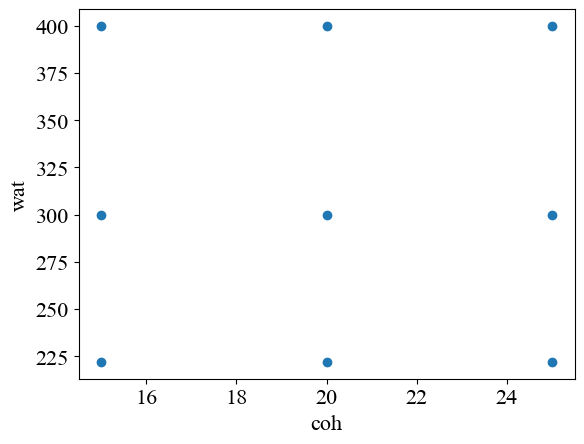

Correlation between 'coh' and 'wat' is: 0.0


In [16]:
plt.scatter(DF_t300_nt20_wt3['coh'], DF_t300_nt20_wt3['wat'])
plt.xlabel('coh')
plt.ylabel('wat')
plt.show()
correlation = DF_t300_nt20_wt3['coh'].corr(DF_t300_nt20_wt3['wat'])
print(f"Correlation between 'coh' and 'wat' is: {correlation}")

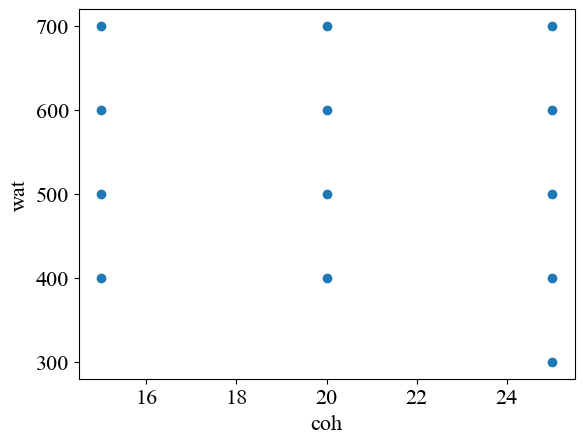

Correlation between 'coh' and 'wat' is: -0.1695158759052026


In [17]:
plt.scatter(DF_t300_nt20_wt7['coh'], DF_t300_nt20_wt7['wat'])
plt.xlabel('coh')
plt.ylabel('wat')
plt.show()
correlation = DF_t300_nt20_wt7['coh'].corr(DF_t300_nt20_wt7['wat'])
print(f"Correlation between 'coh' and 'wat' is: {correlation}")


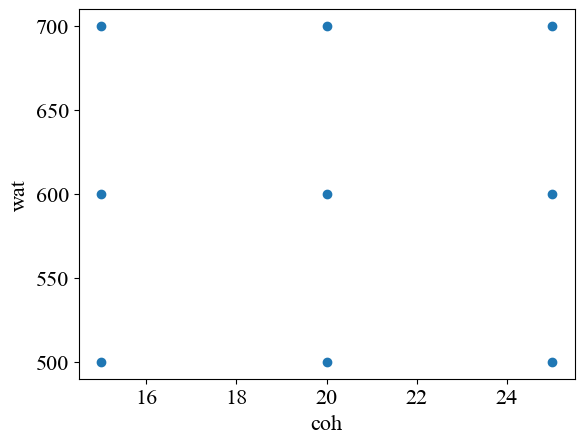

Correlation between 'coh' and 'wat' is: 0.0


In [18]:
plt.scatter(DF_t300_nt30_wt3 ['coh'], DF_t300_nt30_wt3 ['wat'])
plt.xlabel('coh')
plt.ylabel('wat')
plt.show()
correlation = DF_t300_nt30_wt3 ['coh'].corr(DF_t300_nt30_wt3 ['wat'])
print(f"Correlation between 'coh' and 'wat' is: {correlation}")

In [19]:
DF_t300_nt30_wt7

,nt,coh,nafl,temp,wat,water_content_last_1ns_mean,num_of_water_molecules_in_CNT_last_1ns_mean
50,30,15,7,300,1000,6.901454,1019.8315
51,30,15,7,300,1100,6.760154,1154.1840
52,30,15,7,300,1200,6.861464,1229.9205
54,30,20,7,300,900,6.711066,969.2635
55,30,20,7,300,1000,6.916996,1018.4435
56,30,20,7,300,1100,6.893484,1120.8955
57,30,20,7,300,1200,6.908096,1217.1885
58,30,25,7,300,800,6.703510,870.9235
59,30,25,7,300,900,6.776608,953.0925
60,30,25,7,300,1000,6.830264,1038.7205


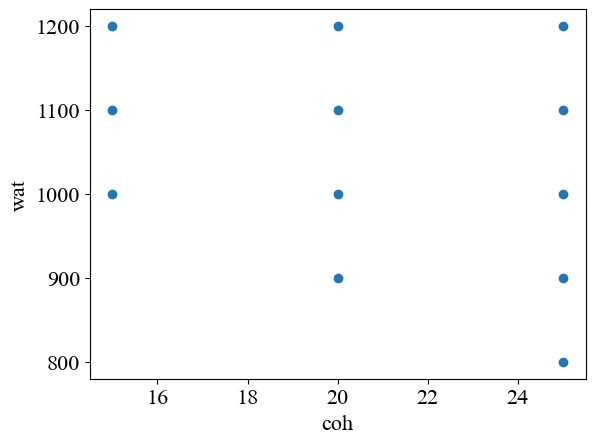

Correlation between 'coh' and 'wat' is: -0.3183105180528656


In [20]:
plt.scatter(DF_t300_nt30_wt7 ['coh'], DF_t300_nt30_wt7 ['wat'])
plt.xlabel('coh')
plt.ylabel('wat')
plt.show()
correlation = DF_t300_nt30_wt7 ['coh'].corr(DF_t300_nt30_wt7 ['wat'])
print(f"Correlation between 'coh' and 'wat' is: {correlation}")

In [21]:
# # Plot the data points and the linear regression line
# plt.scatter(X, y, color='blue', label='Data points')
# plt.plot(X, y_pred, color='red', linewidth=2, label='Regression line')

# # Loop through each unique 'coh' value and emphasize the nearest point to the regression line
# for coh_value in DF_t300_nt30_wt7['coh'].unique():
#     # Filter the DataFrame for the current 'coh' value
#     subset = DF_t300_nt30_wt7[DF_t300_nt30_wt7['coh'] == coh_value]
    
#     # Calculate distances for the current subset
#     distances_subset = np.abs(subset['wat'] - (m * subset['coh'] + b)) / np.sqrt(1 + m**2)
    
#     # Identify the point with the smallest distance in the current subset
#     min_distance_index_subset = np.argmin(distances_subset)
#     closest_point_subset = subset.iloc[min_distance_index_subset]
    
#     # Emphasize the nearest point with a different color and larger size
#     plt.scatter(closest_point_subset['coh'], closest_point_subset['wat'], color='green', s=100, edgecolor='black', zorder=5)

# # Labels and legend
# plt.xlabel('coh')
# plt.ylabel('wat')
# plt.title('Linear Regression Line with Emphasized Points')
# plt.legend()
# plt.show()


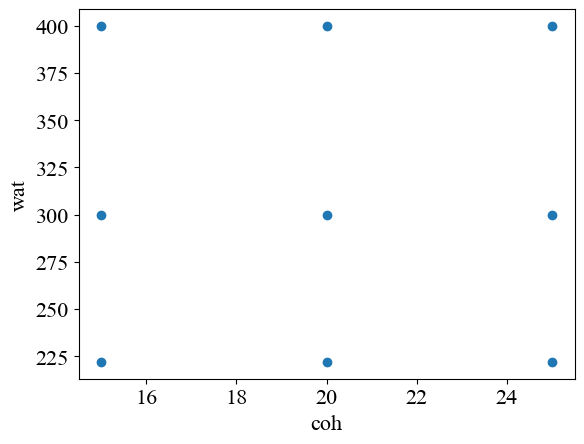

Correlation between 'coh' and 'wat' is: 0.0


In [22]:
plt.scatter(DF_t350_nt20_wt3 ['coh'], DF_t350_nt20_wt3 ['wat'])
plt.xlabel('coh')
plt.ylabel('wat')
plt.show()
correlation = DF_t350_nt20_wt3 ['coh'].corr(DF_t350_nt20_wt3 ['wat'])
print(f"Correlation between 'coh' and 'wat' is: {correlation}")

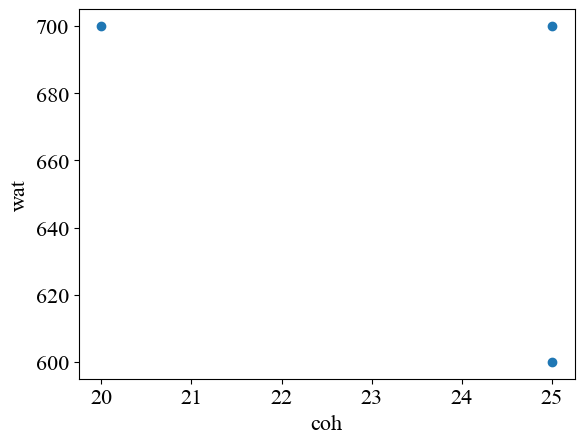

Correlation between 'coh' and 'wat' is: -0.49999999999999994


In [23]:
plt.scatter(DF_t350_nt20_wt7 ['coh'], DF_t350_nt20_wt7 ['wat'])
plt.xlabel('coh')
plt.ylabel('wat')
plt.show()
correlation = DF_t350_nt20_wt7 ['coh'].corr(DF_t350_nt20_wt7 ['wat'])
print(f"Correlation between 'coh' and 'wat' is: {correlation}")


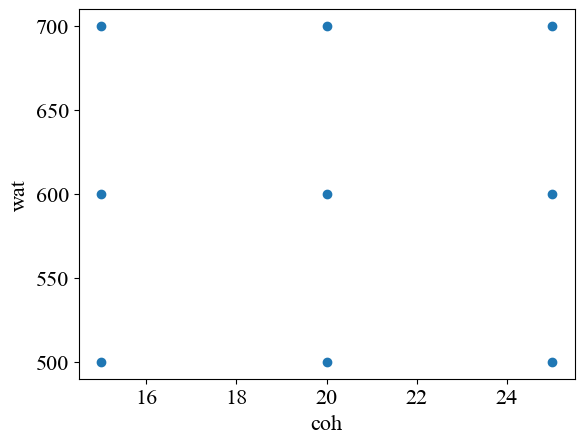

Correlation between 'coh' and 'wat' is: 0.0


In [24]:
plt.scatter(DF_t350_nt30_wt3 ['coh'], DF_t350_nt30_wt3 ['wat'])
plt.xlabel('coh')
plt.ylabel('wat')
plt.show()
correlation = DF_t350_nt30_wt3 ['coh'].corr(DF_t350_nt30_wt3 ['wat'])
print(f"Correlation between 'coh' and 'wat' is: {correlation}")

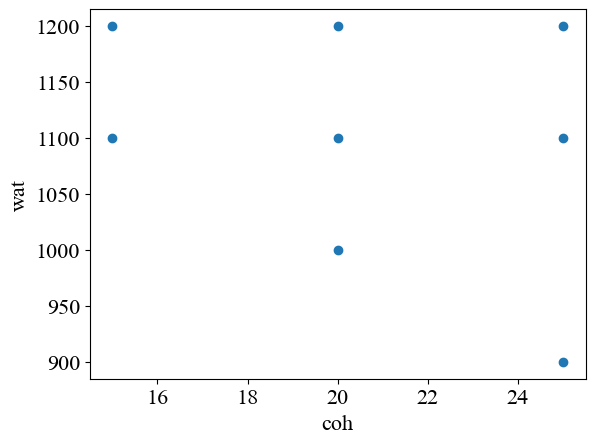

Correlation between 'coh' and 'wat' is: -0.3202563076101743


In [25]:
plt.scatter(DF_t350_nt30_wt7 ['coh'], DF_t350_nt30_wt7 ['wat'])
plt.xlabel('coh')
plt.ylabel('wat')
plt.show()
correlation = DF_t350_nt30_wt7 ['coh'].corr(DF_t350_nt30_wt7 ['wat'])
print(f"Correlation between 'coh' and 'wat' is: {correlation}")

In [26]:
def plot_regression_and_emphasize_nearest(df):

    coh_column = 'coh'
    wat_column = 'wat'

    
    X = df[[coh_column]]
    y = df[wat_column]

    
    model = LinearRegression()
    model.fit(X, y)

    
    y_pred = model.predict(X)

    
    plt.scatter(X, y, color='blue', label='Data points')
    plt.plot(X, y_pred, color='red', linewidth=2, label='Regression line')

    
    for coh_value in df[coh_column].unique():
        
        subset = df[df[coh_column] == coh_value]
        
        
        m = model.coef_[0]
        b = model.intercept_
        distances_subset = np.abs(subset[wat_column] - (m * subset[coh_column] + b)) / np.sqrt(1 + m**2)
        
        
        min_distance_index_subset = np.argmin(distances_subset)
        closest_point_subset = subset.iloc[min_distance_index_subset]
        
        
        plt.scatter(closest_point_subset[coh_column], closest_point_subset[wat_column], 
                    color='green', s=100, edgecolor='black', zorder=5, label='Nearest points')

    
    plt.xlabel(coh_column)
    plt.ylabel(wat_column)
    plt.title(f'Linear Regression Line with Emphasized Points for {coh_column} vs {wat_column}')
    
    
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))  
    plt.legend(by_label.values(), by_label.keys())

    plt.show()




In [27]:
DF_list=[DF_t300_nt20_wt3,
         DF_t300_nt20_wt7,
         DF_t300_nt30_wt3,
         DF_t300_nt30_wt7,
         DF_t350_nt20_wt3,
         DF_t350_nt20_wt7,
         DF_t350_nt30_wt3,
         DF_t350_nt30_wt7,
        ]

DF_list_names =["DF_t300_nt20_wt3",
                 "DF_t300_nt20_wt7",
                 "DF_t300_nt30_wt3",
                 "DF_t300_nt30_wt7",
                 "DF_t350_nt20_wt3",
                 "DF_t350_nt20_wt7",
                 "DF_t350_nt30_wt3",
                 "DF_t350_nt30_wt7",
                ]

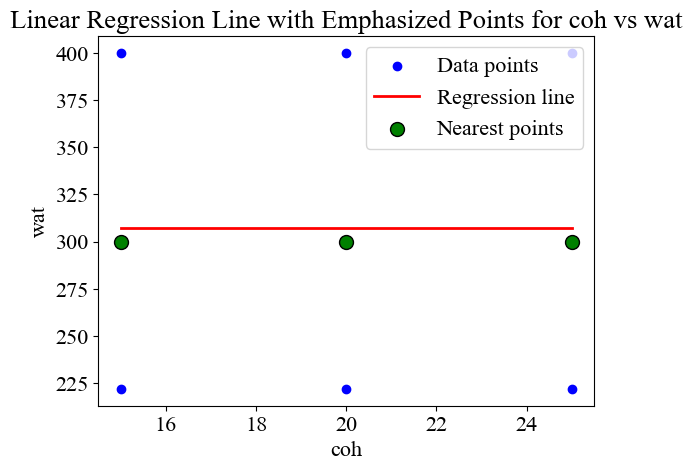

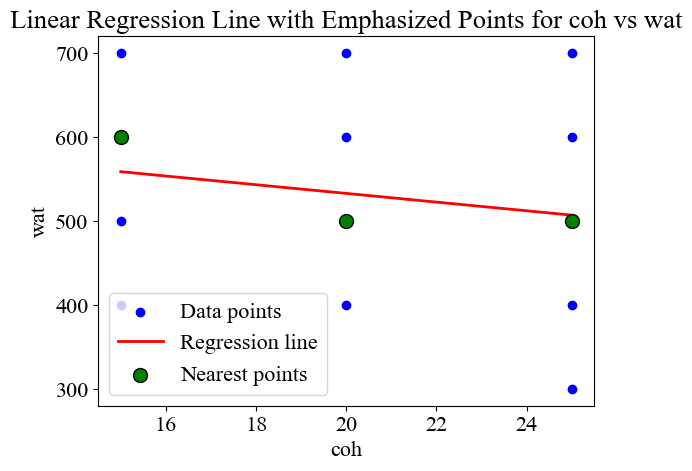

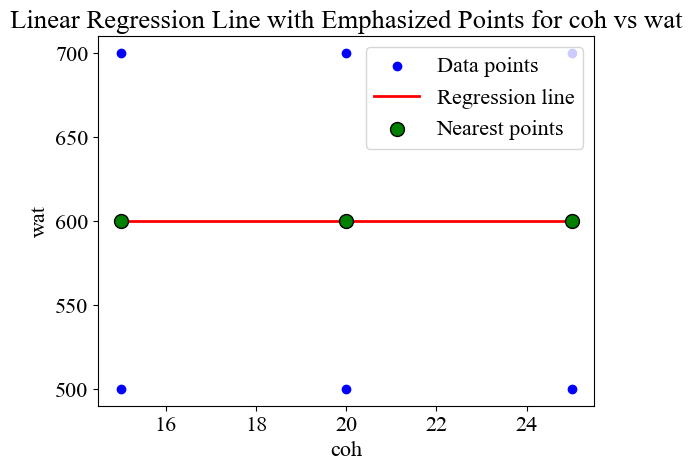

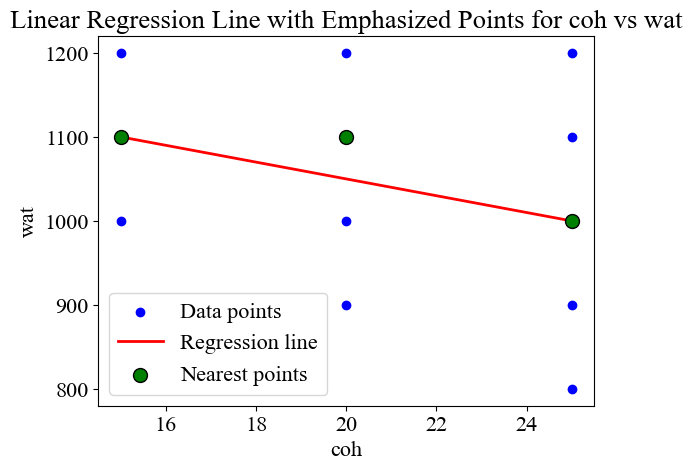

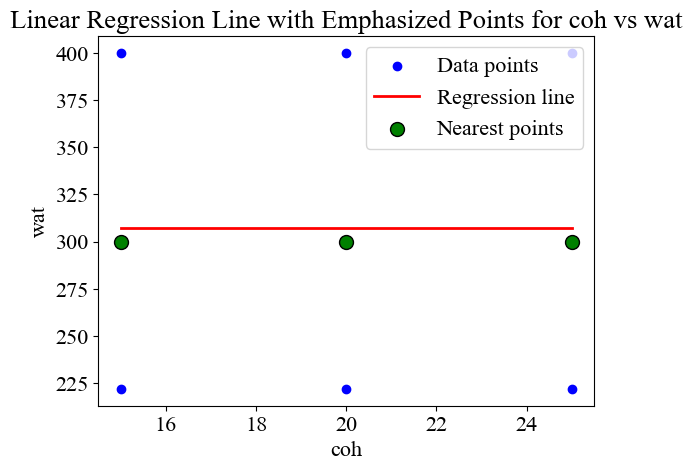

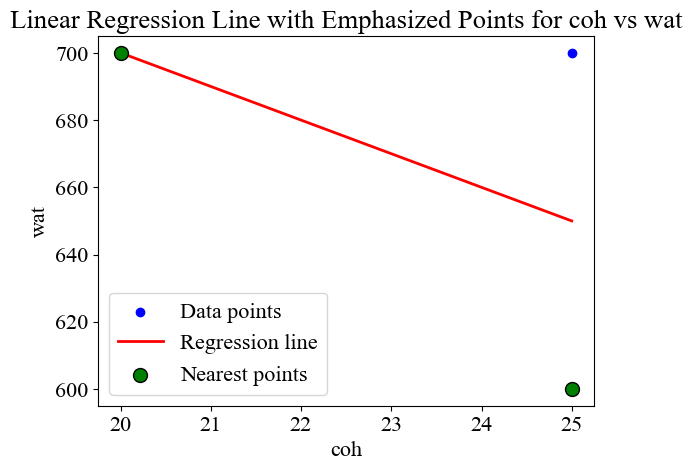

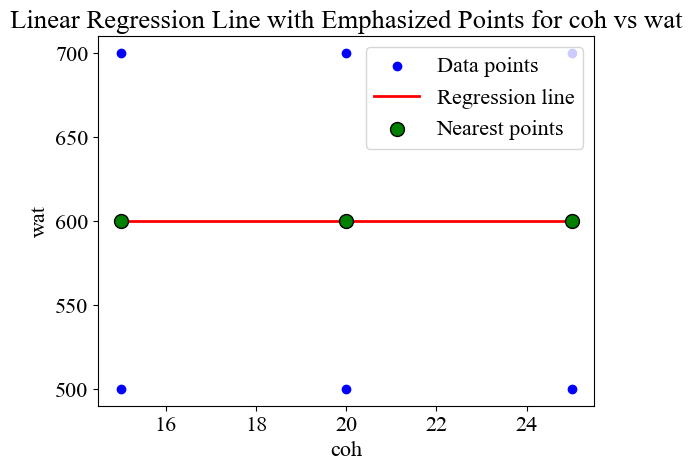

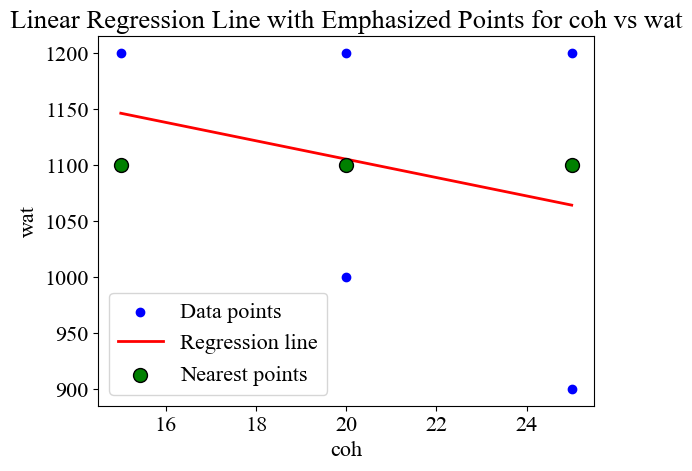

In [28]:
for DF in DF_list:
     plot_regression_and_emphasize_nearest(DF)

In [29]:
def plot_regression_and_emphasize_nearest_ver2(df, df_name_string):
   
    coh_column = 'coh'
    wat_column = 'wat'

    
    X = df[[coh_column]]
    y = df[wat_column]

    
    model = LinearRegression()
    model.fit(X, y)

    
    y_pred = model.predict(X)

    
    plt.scatter(X, y, color='blue', label='Data points')
    plt.plot(X, y_pred, color='red', linewidth=2, label='Regression line')

    
    for coh_value in df[coh_column].unique():
        
        subset = df[df[coh_column] == coh_value]
        
        
        m = model.coef_[0]
        b = model.intercept_
        distances_subset = np.abs(subset[wat_column] - (m * subset[coh_column] + b)) / np.sqrt(1 + m**2)
        
        
        min_distance_index_subset = np.argmin(distances_subset)
        closest_point_subset = subset.iloc[min_distance_index_subset]
        
        plt.scatter(closest_point_subset[coh_column], closest_point_subset[wat_column], 
                    color='green', s=100, edgecolor='black', zorder=5, label='Nearest points')

    plt.xlabel(coh_column)
    plt.ylabel(wat_column)

    plt.title(f"{df_name_string}")
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    plt.legend(by_label.values(), by_label.keys())

    plt.show()




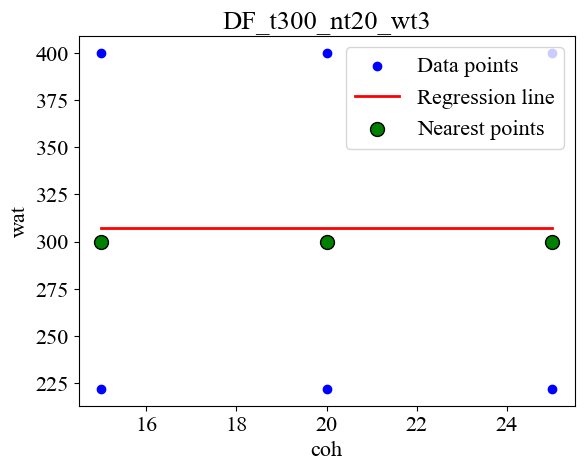

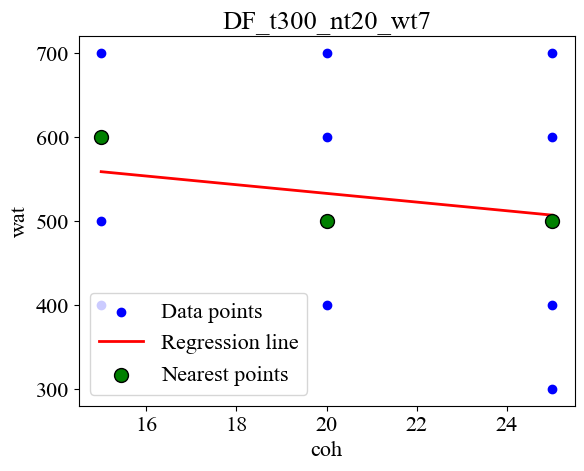

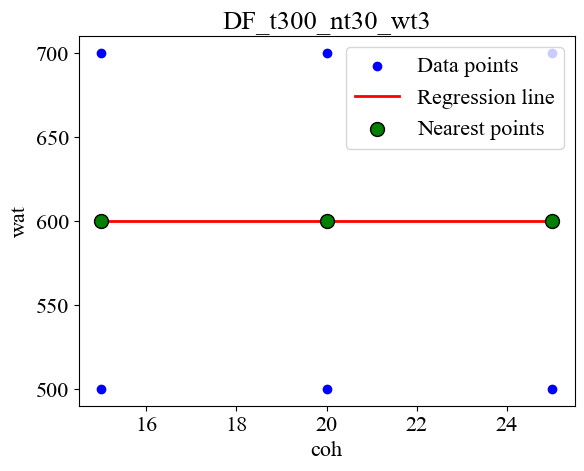

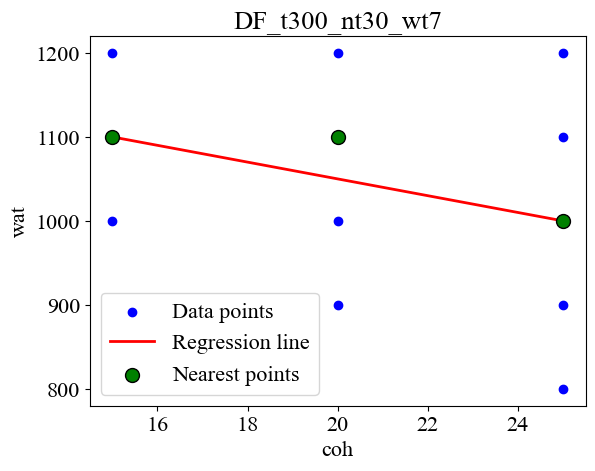

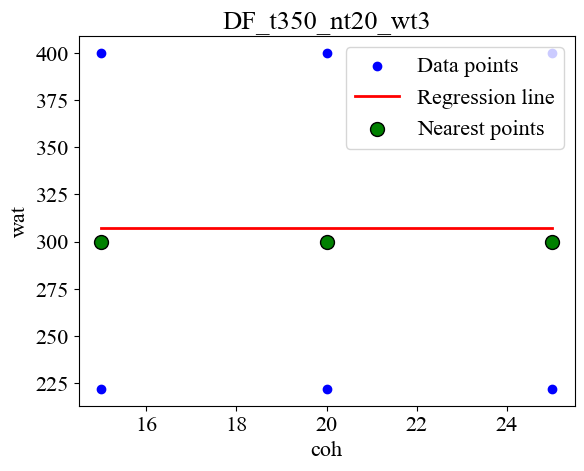

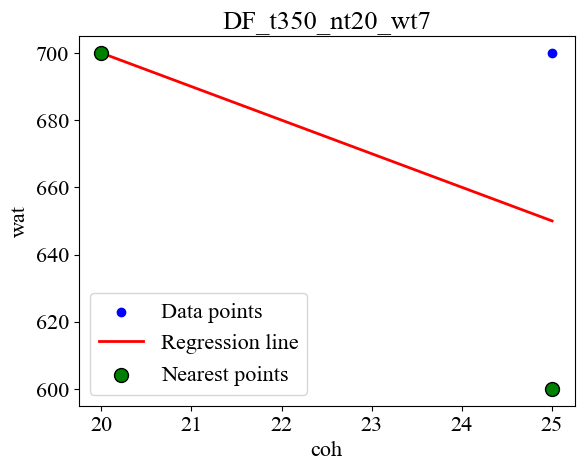

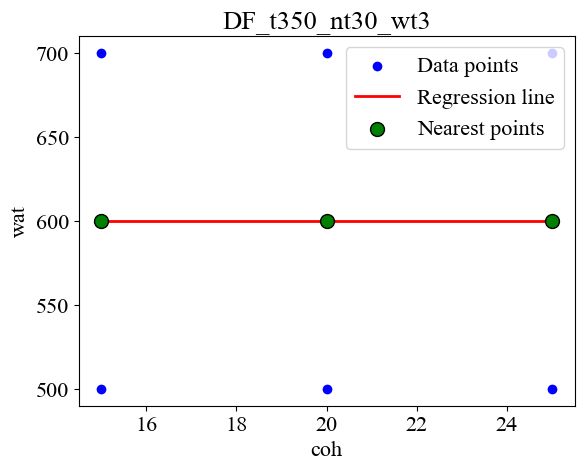

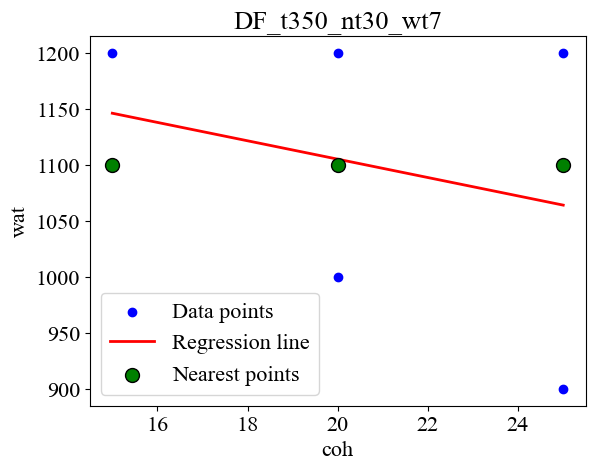

In [30]:
for df, df_name_string in zip(DF_list,DF_list_names):
     plot_regression_and_emphasize_nearest_ver2(df,df_name_string)